## 로드

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import matplotlib as mpl
import numpy as np
from scipy.interpolate import interp1d
import re
mpl.rcParams['svg.fonttype'] = 'none'
from scipy.optimize import root_scalar
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import glob
import matplotlib.cm as cm
import seaborn as sns
from scipy.stats import gaussian_kde
from math import sqrt, pi
import pickle
from collections import defaultdict
from itertools import product
import gurobipy as gp
from gurobipy import GRB
import itertools
from datetime import datetime, timedelta  
import glob

In [4]:
# --- RDC 계산 함수 ---
def compute_rdc_by_sign_change(price_grid, demand_vals, supply_vals, wf_offers):
    rdc = []
    for q in wf_offers:
        resid = demand_vals - supply_vals - q
        idx   = np.where(np.diff(np.sign(resid)) != 0)[0]
        for i in idx:
            p0,p1 = price_grid[i], price_grid[i+1]
            r0,r1 = resid[i], resid[i+1]
            if r1 != r0:
                p_star = p0 - r0*(p1-p0)/(r1-r0)
                rdc.append((q, p_star))
    return rdc

In [15]:
# # --- 1) 기준일 선택 ---
# base_date = "20250601"
# fn_base   = os.path.join("rdcdata", f"filteredcurve_{base_date}.csv")
# df_base   = pd.read_csv(fn_base, encoding="utf-8-sig")

# W = list(range(100))  # 시나리오 개수
# wf_offer_grid = np.arange(0, 2000, 10)
# B = 10  # stepwise block 수

# qini_big, qmax_big, lambda_da_big = {}, {}, {}
# valid_blocks_by_w = defaultdict(list)

# # --- 2) 시간대별 반복 ---
# for t in range(1, 25):
#     df_t = df_base[df_base["Time Period"] == t]
#     sup  = df_t[df_t["GC"] == "V"]
#     dem  = df_t[df_t["GC"] == "C"]
#     if sup.empty or dem.empty:
#         continue

#     # 공급/수요 곡선 (기준)
#     s_agg = sup.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
#     s_agg["Cumul"] = s_agg["Amount"].cumsum()

#     d_agg = dem.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
#     d_agg["Cumul"] = d_agg["Amount"][::-1].cumsum()[::-1]

#     pmin = min(s_agg["Price"].min(), d_agg["Price"].min())
#     pmax = max(s_agg["Price"].max(), d_agg["Price"].max())
#     price_grid = np.linspace(pmin, pmax, 500)

#     # --- 3) 시나리오 생성 ---
#     for w in W:
#         # (a) 공급/수요량에 noise 추가
#         noise_s = np.random.normal(0, 0.05, len(s_agg))  # ±5%
#         noise_d = np.random.normal(0, 0.05, len(d_agg))
#         s_cumul = (s_agg["Cumul"].values * (1+noise_s)).clip(min=0)
#         d_cumul = (d_agg["Cumul"].values * (1+noise_d)).clip(min=0)

#         # (b) 보간 함수
#         s_f = interp1d(s_agg["Price"], s_cumul, kind="previous",
#                        bounds_error=False, fill_value=(0, s_cumul[-1]))
#         d_f = interp1d(d_agg["Price"], d_cumul, kind="previous",
#                        bounds_error=False, fill_value=(d_cumul[0], 0))

#         supply_vals = s_f(price_grid)
#         demand_vals = d_f(price_grid)

#         # (c) RDC 계산
#         rdc_pts = compute_rdc_by_sign_change(price_grid, demand_vals, supply_vals, wf_offer_grid)
#         if not rdc_pts:
#             continue
#         qv, pv = zip(*rdc_pts)

#         # (d) stepwise 근사
#         q_breaks = np.linspace(min(qv), max(qv), B+1)
#         for b in range(B):
#             q_low, q_high = q_breaks[b], q_breaks[b+1]
#             mask = (np.array(qv) >= q_low) & (np.array(qv) < q_high)
#             if not mask.any():
#                 continue
#             scen_name = f"{base_date}_w{w}"
#             qini_big[(t,b,w)]      = q_low
#             qmax_big[(t,b,w)]      = q_high - q_low
#             lambda_da_big[(t,b,w)] = np.mean(np.array(pv)[mask])
#             if qmax_big[(t,b,w)] > 0:
#                 valid_blocks_by_w[(t,w)].append(b)

# # --- 4) DataFrame 변환 및 저장 ---
# df_rdc = pd.DataFrame([
#     {"scenario": f"{base_date}_w{w}", "t": t, "b": b,
#      "qini": qini_big[(t,b,w)], "qmax": qmax_big[(t,b,w)],
#      "lam_da": lambda_da_big[(t,b,w)]}
#     for (t,b,w) in qini_big.keys()
# ])
# df_rdc.to_csv(f"rdc_scenarios_{base_date}_noise.csv", index=False, encoding="utf-8-sig")
# print("✅ 저장 완료:", f"rdc_scenarios_{base_date}_noise.csv")


In [16]:
# # --------------------------
# # 1) 발전량 불러오기 (base_date=2025-06-01)
# # --------------------------
# gen_file = "co2freegeneration.csv"
# df_gen   = pd.read_csv(gen_file, sep=";")
# df_gen["datetime"] = pd.to_datetime(df_gen["datetime"])
# df_gen["date"]     = df_gen["datetime"].dt.date
# df_gen["hour"]     = df_gen["datetime"].dt.hour

# base_date = pd.to_datetime("2025-06-01").date()
# df_gen_day = df_gen[df_gen["date"] == base_date]
# gen_base = {int(row["hour"])+1: row["value"] for _, row in df_gen_day.iterrows()}

# # --------------------------
# # 2) 가격 불러오기 (base_date=2025-06-01)
# # --------------------------
# rt_file = "rtdata/marginalpibc_2025060102.1"  # 파일 경로 맞춰주세요
# df_rt   = pd.read_csv(rt_file, sep=";", encoding="latin-1", skiprows=1, header=None)
# df_rt = df_rt.dropna(how="all", axis=1)
# df_rt.columns = ["Year","Month","Day","Period","Price1","Price2"][:df_rt.shape[1]]
# df_rt = df_rt.dropna(subset=["Period","Price1"])
# df_rt["Period"] = df_rt["Period"].astype(int)

# rt_base = {}
# for _, row in df_rt.iterrows():
#     period = int(row["Period"])
#     t = (period-1)//4 + 1
#     j = (period-1)%4 + 1
#     rt_base[(t,j)] = float(row["Price1"])/4

# # --------------------------
# # 3) 노이즈 기반 시나리오 생성
# # --------------------------
# W = list(range(100))
# gen_scen = {}
# rt_scen  = {}

# for w in W:
#     # 발전량 (±5% multiplicative noise)
#     for t,v in gen_base.items():
#         noise = np.random.normal(0, 0.05)
#         gen_scen[(t,w)] = max(0, v*(1+noise))

#     # 가격 (±2 additive noise)
#     for (t,j),v in rt_base.items():
#         noise = np.random.normal(0, 2)
#         rt_scen[(t,j,w)] = max(0, v+noise)

# # --------------------------
# # 4) 시각화 예시
# # --------------------------
# # 발전량
# plt.figure(figsize=(10,6))
# for w in W:
#     vals = [gen_scen[(t,w)] for t in range(1,25)]
#     plt.plot(range(1,25), vals, alpha=0.3)
# plt.xlabel("Hour of Day")
# plt.ylabel("Generation (MW)")
# plt.title("Generation Scenarios (100 paths, 2025-06-01)")
# plt.grid(True)
# plt.show()

# # 가격
# plt.figure(figsize=(10,6))
# for w in W:
#     vals = [rt_scen[(t,j,w)] for t in range(1,25) for j in range(1,5)]
#     plt.plot(range(1,97), vals, alpha=0.3)
# plt.xlabel("Period (1–96)")
# plt.ylabel("Price (€/MWh)")
# plt.title("Real-Time Price Scenarios (100 paths, 2025-06-01)")
# plt.grid(True)
# plt.show()


In [17]:
# rows = []

# for w in W:
#     for t in range(1,25):
#         # --- 발전량 ---
#         gen_val = gen_scen.get((t,w), None)

#         # --- 실시간 가격 (4개 period 평균 예시) ---
#         rt_vals = [rt_scen.get((t,j,w), None) for j in range(1,5)]
#         rt_avg  = np.mean(rt_vals) if None not in rt_vals else None

#         # --- RDC 블록 ---
#         for b in valid_blocks_by_w[(t,w)]:
#             qini_val = qini_big.get((t,b,w), None)
#             qmax_val = qmax_big.get((t,b,w), None)
#             lam_val  = lambda_da_big.get((t,b,w), None)

#             rows.append({
#                 "scenario": w,
#                 "t": t,
#                 "b": b,
#                 "gen": gen_val,
#                 "rt_avg": rt_avg,
#                 "qini": qini_val,
#                 "qmax": qmax_val,
#                 "lam_da": lam_val
#             })

# df_all = pd.DataFrame(rows)


In [18]:
# print(df_all.head(10))
# print("총 시나리오 수:", df_all["scenario"].nunique())

In [19]:
for w in W:
    for t in T:
        for b in valid_blocks_by_w.get((t,w), []):
            if (t,b,w) not in lambda_da_big:
                print("lambda missing:", (t,b,w))
            if (t,b,w) not in qini_big:
                print("qini missing:", (t,b,w))


## 시나리오생성 2

In [ ]:
# ---------------------------
# 0) 기본 설정
# ---------------------------
W = list(range(100))   # 100 시나리오
rho_w = {w: 1/len(W) for w in W}

qini_big, qmax_big, lambda_da_big = {}, {}, {}
pwf_big, rt_big = {}, {}
valid_blocks_by_w = defaultdict(list)

base_date = pd.to_datetime("2025-06-01")
date_str  = base_date.strftime("%Y%m%d")

# ---------------------------
# 1) 발전량 (base_date)
# ---------------------------
df_pwf = pd.read_csv("co2freegeneration_filled.csv", sep=",")
df_pwf["datetime"] = pd.to_datetime(df_pwf["datetime"])
df_pwf["date"] = df_pwf["datetime"].dt.date
df_pwf["hour"] = df_pwf["datetime"].dt.hour
sub_pwf = df_pwf[df_pwf["date"] == base_date.date()]
pwf_base = {int(row["hour"])+1: row["value"]/20 for _,row in sub_pwf.iterrows()}

# ---------------------------
# 2) 실시간 가격 (base_date)
# ---------------------------
rt_files = sorted(glob.glob("rtdata/marginalpibc_2025*.1"))
fmatch = [f for f in rt_files if date_str in f]
df_rt = pd.read_csv(fmatch[0], sep=";", encoding="latin-1", skiprows=1, header=None)
df_rt = df_rt.dropna(how="all", axis=1)
df_rt.columns = ["Year","Month","Day","Period","Price1","Price2"][:df_rt.shape[1]]
df_rt = df_rt.dropna(subset=["Period","Price1"])
df_rt["Period"] = df_rt["Period"].astype(int)

rt_base = {}
for _, row in df_rt.iterrows():
    period = int(row["Period"])
    t = (period-1)//4 + 1
    j = (period-1)%4 + 1
    rt_base[(t,j)] = float(row["Price1"])/4

# ---------------------------
# 3) 수요·공급 곡선 (base_date)
# ---------------------------
fn = f"rdcdata/filteredcurve_{date_str}.csv"
df_base = pd.read_csv(fn, encoding="utf-8-sig")

wf_offer_grid = np.arange(0, 2000, 10)
B = 10  # stepwise block 수

# ---------------------------
# 4) 시나리오 생성 (노이즈)
# ---------------------------
for w in W:

    # --- 발전량 노이즈 (±5%)
    for t,v in pwf_base.items():
        noise = np.random.normal(0, 0.05)
        pwf_big[(0,t,w)] = max(0, v*(1+noise))

    # --- 실시간 가격 노이즈 (±2 €/MWh)
    for (t,j),v in rt_base.items():
        noise = np.random.normal(0, 2)
        rt_big[(t,j,w)] = max(0, v+noise)

    # --- 시간대별 RDC 노이즈 ---
    for t in range(1,25):
        df_t = df_base[df_base["Time Period"] == t]
        sup  = df_t[df_t["GC"] == "V"]
        dem  = df_t[df_t["GC"] == "C"]
        if sup.empty or dem.empty:
            continue

        # 공급/수요 집계
        s_agg = sup.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
        s_agg["Cumul"] = s_agg["Amount"].cumsum()

        d_agg = dem.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
        d_agg["Cumul"] = d_agg["Amount"][::-1].cumsum()[::-1]

        # 노이즈 (±5%)
        noise_s = np.random.normal(0, 0.05, len(s_agg))
        noise_d = np.random.normal(0, 0.05, len(d_agg))
        s_cumul = (s_agg["Cumul"].values * (1+noise_s)).clip(min=0)
        d_cumul = (d_agg["Cumul"].values * (1+noise_d)).clip(min=0)

        # 보간
        s_f = interp1d(s_agg["Price"], s_cumul, kind="previous",
                       bounds_error=False, fill_value=(0, s_cumul[-1]))
        d_f = interp1d(d_agg["Price"], d_cumul, kind="previous",
                       bounds_error=False, fill_value=(d_cumul[0], 0))

        price_grid = np.linspace(min(s_agg["Price"].min(), d_agg["Price"].min()),
                                 max(s_agg["Price"].max(), d_agg["Price"].max()), 500)
        sv, dv = s_f(price_grid), d_f(price_grid)

        # RDC 계산
        rdc_pts = compute_rdc_by_sign_change(price_grid, dv, sv, wf_offer_grid)
        if not rdc_pts:
            continue
        qv, pv = zip(*rdc_pts)

        # stepwise 근사
        q_breaks = np.linspace(min(qv), max(qv), B+1)
        for b in range(B):
            q_low, q_high = q_breaks[b], q_breaks[b+1]
            mask = (np.array(qv) >= q_low) & (np.array(qv) < q_high)
            if not mask.any():
                continue

            qini_big[(t,b,w)]      = q_low
            qmax_big[(t,b,w)]      = q_high - q_low
            lambda_da_big[(t,b,w)] = np.mean(np.array(pv)[mask])

            if qmax_big[(t,b,w)] > 0:
                valid_blocks_by_w[(t,w)].append(b)

    # 블록 정리
    for t in range(1,25):
        valid_blocks_by_w[(t,w)] = sorted(set(valid_blocks_by_w[(t,w)]))

# ---------------------------
# 5) 결과 확인
# ---------------------------
print("총 시나리오 수:", len(W))   # 100
print("예시 발전량:", list(pwf_big.items())[:3])
print("예시 가격:", list(rt_big.items())[:6])
print("예시 RDC:", list(qini_big.items())[:3])


총 시나리오 수: 100
예시 발전량: [((0, 1, 0), 932.1999722076738), ((0, 2, 0), 922.00293415823), ((0, 3, 0), 803.2517034841478)]
예시 가격: [((1, 1, 0), 19.518012889455417), ((1, 2, 0), 15.354121495731798), ((1, 3, 0), 6.577262671628784), ((1, 4, 0), 0.9817973246146092), ((2, 1, 0), 7.835708383126605), ((2, 2, 0), 9.825371560035803)]
예시 RDC: [((1, 0, 0), 0.0), ((1, 1, 0), 199.0), ((1, 2, 0), 398.0)]


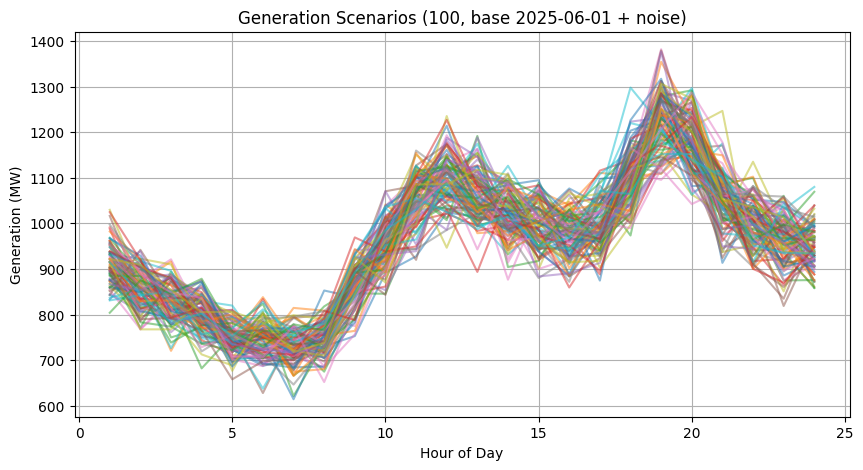

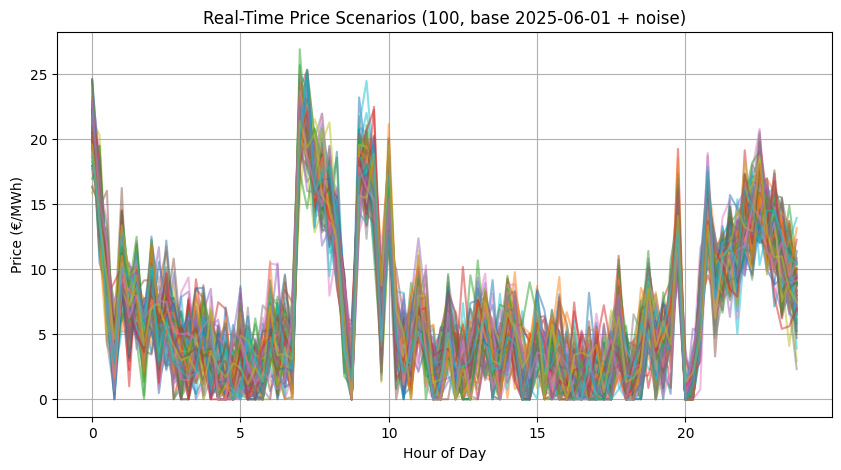

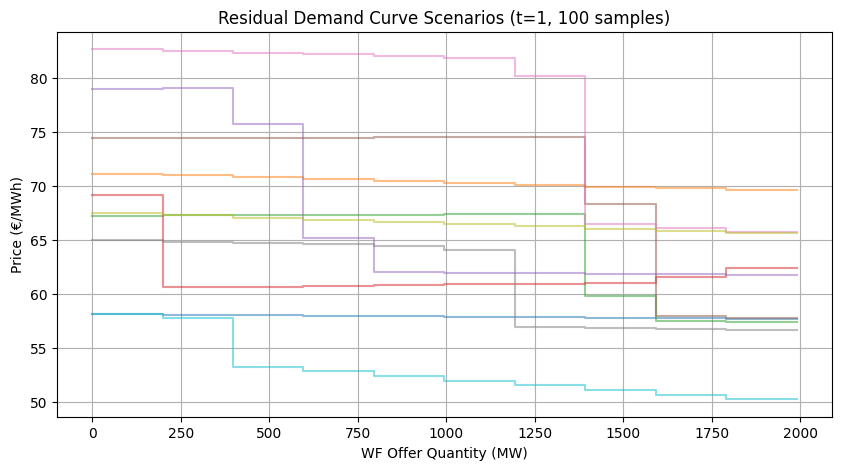

In [29]:
# ---------------------------
# 발전량 시나리오 (pwf_big)
# ---------------------------
plt.figure(figsize=(10,5))
for w in W:
    vals = [pwf_big.get((0,t,w), None) for t in range(1,25)]
    plt.plot(range(1,25), vals, alpha=0.5)
plt.title("Generation Scenarios (100, base 2025-06-01 + noise)")
plt.xlabel("Hour of Day")
plt.ylabel("Generation (MW)")
plt.grid(True)
plt.show()

# ---------------------------
# 실시간 가격 시나리오 (rt_big)
# ---------------------------
plt.figure(figsize=(10,5))
for w in W:
    vals = [rt_big.get((t,j,w), None) for t in range(1,25) for j in range(1,5)]
    x    = [(t-1) + (j-1)*0.25 for t in range(1,25) for j in range(1,5)]
    plt.plot(x, vals, alpha=0.5)
plt.title("Real-Time Price Scenarios (100, base 2025-06-01 + noise)")
plt.xlabel("Hour of Day")
plt.ylabel("Price (€/MWh)")
plt.grid(True)
plt.show()

# ---------------------------
# RDC 시나리오 (qini_big, lambda_da_big)
# ---------------------------
# 특정 시간대 t=12 (정오) 예시로 100개 시나리오 비교
plt.figure(figsize=(10,5))
t_select = 1
for w in range(10):
    qs, ps = [], []
    for b in valid_blocks_by_w.get((t_select,w), []):
        qini = qini_big[(t_select,b,w)]
        qmax = qmax_big[(t_select,b,w)]
        lam  = lambda_da_big[(t_select,b,w)]
        qs.extend([qini, qini+qmax])
        ps.extend([lam, lam])
    if qs:
        plt.step(qs, ps, where="post", alpha=0.5)
plt.title(f"Residual Demand Curve Scenarios (t={t_select}, 100 samples)")
plt.xlabel("WF Offer Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.grid(True)
plt.show()


In [20]:
for w in W:
    for t in T:
        for b in valid_blocks_by_w.get((t,w), []):
            if (t,b,w) not in lambda_da_big:
                print("lambda missing:", (t,b,w))
            if (t,b,w) not in qini_big:
                print("qini missing:", (t,b,w))

## 시나리오생성3: 수요공급에 노이즈 normal

In [5]:
base_date = "20250601"
fn_base   = f"rdcdata/filteredcurve_{base_date}.csv"

# 기준일 원본 곡선 불러오기
df_base = pd.read_csv(fn_base, encoding="utf-8-sig")

# 저장 디렉토리 생성
out_dir = f"scenarios_{base_date}"
os.makedirs(out_dir, exist_ok=True)

num_scenarios = 100  # 시나리오 개수

for w in range(num_scenarios):
    df_scen = []
    for period in range(1,25):
        sub = df_base[df_base["Time Period"] == period]
        if sub.empty:
            continue

        # 공급/수요 따로 분리
        sup = sub[sub["GC"]=="V"].copy()
        dem = sub[sub["GC"]=="C"].copy()

        # 노이즈 주기 (±5%)
        sup["Amount"] = sup["Amount"] * (1 + np.random.normal(0, 0.1, len(sup)))
        dem["Amount"] = dem["Amount"] * (1 + np.random.normal(0, 0.1, len(dem)))

        # 결과 합치기
        df_scen.append(pd.concat([sup,dem]))

    # concat 후 CSV 저장
    df_out = pd.concat(df_scen).reset_index(drop=True)
    out_path = os.path.join(out_dir, f"curve_scen{w:03d}.csv")
    df_out.to_csv(out_path, index=False, encoding="utf-8-sig")

print(f"✅ {num_scenarios}개 시나리오 생성 완료 → {out_dir}")

✅ 100개 시나리오 생성 완료 → scenarios_20250601


In [2]:
def load_curves_from_path(file_path, period):
    df = pd.read_csv(file_path, sep=',', encoding='utf-8-sig')
    mask   = df['Time Period'] == period
    supply = df[mask & (df['GC'] == 'V')]
    demand = df[mask & (df['GC'] == 'C')]
    if supply.empty or demand.empty:
        return None

    # 공급 곡선 집계
    s_agg = (supply.groupby('Price')['Amount'].sum()
                   .reset_index().sort_values('Price'))
    s_agg['CumulQty'] = s_agg['Amount'].cumsum()

    # 수요 곡선 집계
    d_agg = (demand.groupby('Price')['Amount'].sum()
                   .reset_index().sort_values('Price'))
    d_agg['CumulQty'] = d_agg['Amount'][::-1].cumsum()[::-1]

    pmin = min(s_agg['Price'].min(), d_agg['Price'].min())
    pmax = max(s_agg['Price'].max(), d_agg['Price'].max())
    price_grid  = np.linspace(pmin, pmax, 500)

    s_func = interp1d(s_agg['Price'], s_agg['CumulQty'],
                      kind='previous', bounds_error=False,
                      fill_value=(0, s_agg['CumulQty'].iloc[-1]))
    d_func = interp1d(d_agg['Price'], d_agg['CumulQty'],
                      kind='previous', bounds_error=False,
                      fill_value=(d_agg['CumulQty'].iloc[0], 0))

    supply_vals = s_func(price_grid)
    demand_vals = d_func(price_grid)
    return price_grid, supply_vals, demand_vals


# --------------------------
# 저장된 시나리오 불러오기
# --------------------------
date_str = "20250601"
scenario_dir = f"scenarios_{date_str}"
scenario_files = sorted(glob.glob(os.path.join(scenario_dir, "*.csv")))

# --------------------------
# 각 시간대마다 곡선 플롯
# --------------------------
for period in range(1,25):
    plt.figure(figsize=(8,5))
    any_plotted = False
    for fp in scenario_files:
        out = load_curves_from_path(fp, period)
        if out is None: continue
        price_grid, supply_vals, demand_vals = out
        plt.plot(supply_vals, price_grid, color="blue", alpha=0.3, lw=1)
        plt.plot(demand_vals, price_grid, color="red",  alpha=0.3, lw=1)
        any_plotted = True

    if not any_plotted:
        plt.close()
        continue

    plt.xlabel("Cumulative Quantity")
    plt.ylabel("Price")
    plt.title(f"Supply & Demand Curves – Period {period} ({date_str}, {len(scenario_files)} scenarios)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


NameError: name 'glob' is not defined

In [6]:
# ---------------------------
# 기본 설정
# ---------------------------
base_date = "20250601"
scenario_dir = f"scenarios_{base_date}"  # 앞에서 만든 S&D 곡선 시나리오 폴더
scenario_files = sorted(glob.glob(os.path.join(scenario_dir, "*.csv")))
W = list(range(100))     # 시나리오 개수

qini_big, qmax_big, lambda_da_big = {}, {}, {}
rt_big, pwf_big = {}, {}
valid_blocks_by_w = defaultdict(list)

wf_offer_grid = np.arange(0, 2000, 10)
B = 200  # stepwise block 수

# ---------------------------
# 기준일 발전량 / 가격 불러오기
# ---------------------------
df_pwf = pd.read_csv("co2freegeneration_filled.csv", sep=",")
df_pwf["datetime"] = pd.to_datetime(df_pwf["datetime"])
df_pwf["date"] = df_pwf["datetime"].dt.date
df_pwf["hour"] = df_pwf["datetime"].dt.hour

date_pd = pd.to_datetime(base_date)
sub_pwf = df_pwf[df_pwf["date"] == date_pd.date()]
pwf_base = {int(row["hour"])+1: row["value"]/20 for _,row in sub_pwf.iterrows()}

rt_files = sorted(glob.glob("rtdata/marginalpibc_2025*.1"))
fmatch = [f for f in rt_files if base_date in f]
df_rt = pd.read_csv(fmatch[0], sep=";", encoding="latin-1", skiprows=1, header=None)
df_rt = df_rt.dropna(how="all", axis=1)
df_rt.columns = ["Year","Month","Day","Period","Price1","Price2"][:df_rt.shape[1]]
df_rt = df_rt.dropna(subset=["Period","Price1"])
df_rt["Period"] = df_rt["Period"].astype(int)
rt_base = {}
for _, row in df_rt.iterrows():
    period = int(row["Period"])
    t = (period-1)//4 + 1
    j = (period-1)%4 + 1
    rt_base[(t,j)] = float(row["Price1"])/4

# ---------------------------
# 시나리오별로 합치기
# ---------------------------
for w, fp in enumerate(scenario_files):
    # --- 발전량 노이즈 (±5%)
    for t,v in pwf_base.items():
        pwf_big[(0,t,w)] = max(0, v*(1+np.random.normal(0,0.05)))

    # --- 실시간 가격 노이즈 (±2 €/MWh)
    for (t,j),v in rt_base.items():
        rt_big[(t,j,w)] = max(0, v+np.random.normal(0,2))

    # --- S&D 곡선 → RDC 변환 ---
    df = pd.read_csv(fp, encoding="utf-8-sig")
    for t in range(1,25):
        df_t = df[df["Time Period"] == t]
        sup  = df_t[df_t["GC"] == "V"]
        dem  = df_t[df_t["GC"] == "C"]
        if sup.empty or dem.empty:
            continue

        # 집계
        s_agg = sup.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
        s_agg["Cumul"] = s_agg["Amount"].cumsum()

        d_agg = dem.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
        d_agg["Cumul"] = d_agg["Amount"][::-1].cumsum()[::-1]

        # 보간
        s_f = interp1d(s_agg["Price"], s_agg["Cumul"],
                       kind="previous", bounds_error=False, fill_value=(0,s_agg["Cumul"].iloc[-1]))
        d_f = interp1d(d_agg["Price"], d_agg["Cumul"],
                       kind="previous", bounds_error=False, fill_value=(d_agg["Cumul"].iloc[0],0))

        price_grid = np.linspace(min(s_agg["Price"].min(), d_agg["Price"].min()),
                                 max(s_agg["Price"].max(), d_agg["Price"].max()), 500)
        sv, dv = s_f(price_grid), d_f(price_grid)

        # RDC 계산
        rdc_pts = compute_rdc_by_sign_change(price_grid, dv, sv, wf_offer_grid)
        if not rdc_pts:
            continue
        qv, pv = zip(*rdc_pts)

        # stepwise 근사
        q_breaks = np.linspace(min(qv), max(qv), B+1)
        for b in range(B):
            q_low, q_high = q_breaks[b], q_breaks[b+1]
            mask = (np.array(qv) >= q_low) & (np.array(qv) < q_high)
            if not mask.any():
                continue

            qini_big[(t,b,w)]      = q_low
            qmax_big[(t,b,w)]      = q_high - q_low
            lambda_da_big[(t,b,w)] = np.mean(np.array(pv)[mask])

            if qmax_big[(t,b,w)] > 0:
                valid_blocks_by_w[(t,w)].append(b)

    # 블록 정리
    for t in range(1,25):
        valid_blocks_by_w[(t,w)] = sorted(set(valid_blocks_by_w[(t,w)]))

print(f"✅ 통합 시나리오 {len(W)}개 생성 완료")
print("예시 발전량:", list(pwf_big.items())[:3])
print("예시 가격:", list(rt_big.items())[:6])
print("예시 RDC:", list(qini_big.items())[:3])

✅ 통합 시나리오 100개 생성 완료
예시 발전량: [((0, 1, 0), 876.3988014124429), ((0, 2, 0), 851.939011634614), ((0, 3, 0), 856.7456400523268)]
예시 가격: [((1, 1, 0), 17.612960222646507), ((1, 2, 0), 14.51897461072744), ((1, 3, 0), 5.26686457561555), ((1, 4, 0), 7.682060908707551), ((2, 1, 0), 9.118968688401116), ((2, 2, 0), 9.952019663338364)]
예시 RDC: [((1, 0, 0), 0.0), ((1, 1, 0), 9.95), ((1, 2, 0), 19.9)]


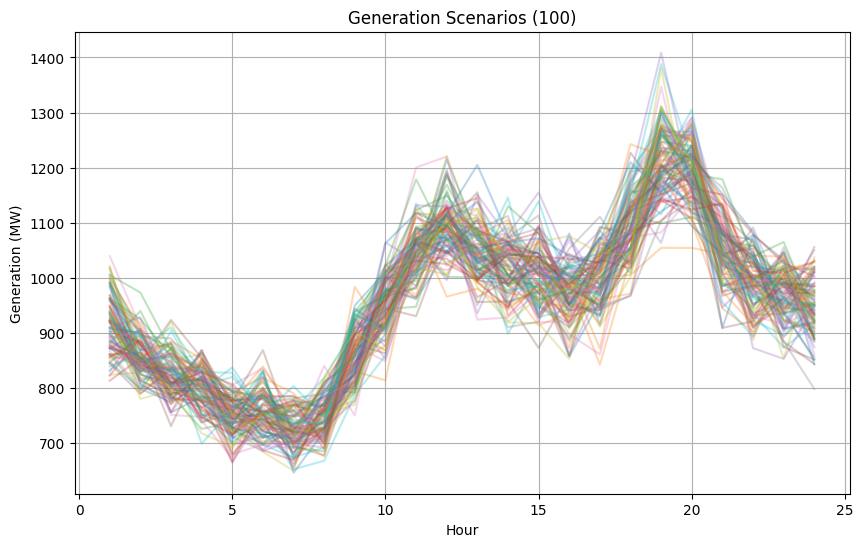

In [7]:
plt.figure(figsize=(10,6))
for w in W:
    vals = [pwf_big[(0,t,w)] for t in range(1,25)]
    plt.plot(range(1,25), vals, alpha=0.3)
plt.xlabel("Hour")
plt.ylabel("Generation (MW)")
plt.title("Generation Scenarios (100)")
plt.grid(True)
plt.show()

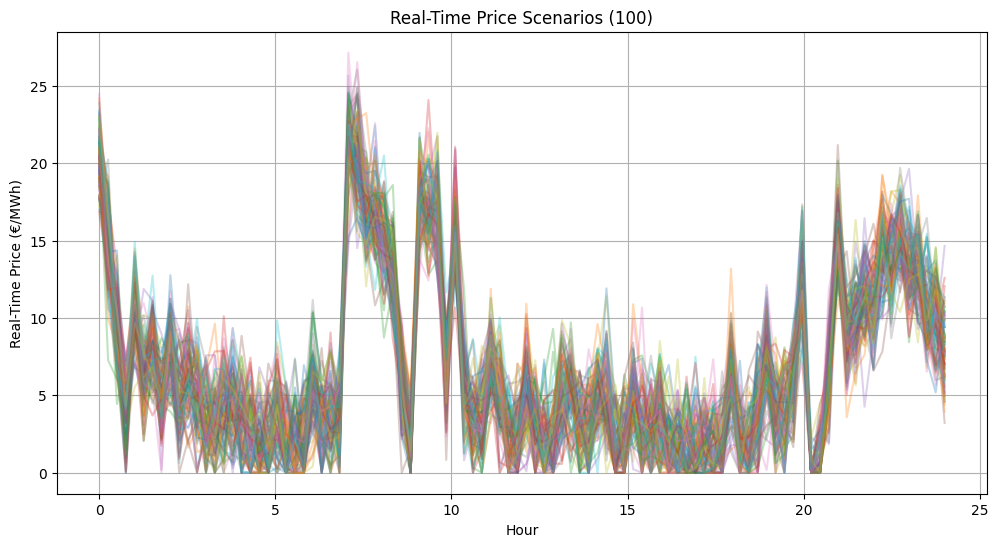

In [106]:
plt.figure(figsize=(12,6))
for w in W:
    vals = [rt_big[(t,j,w)] for t in range(1,25) for j in range(1,5)]
    plt.plot(np.linspace(0,24,len(vals)), vals, alpha=0.3)
plt.xlabel("Hour")
plt.ylabel("Real-Time Price (€/MWh)")
plt.title("Real-Time Price Scenarios (100)")
plt.grid(True)
plt.show()

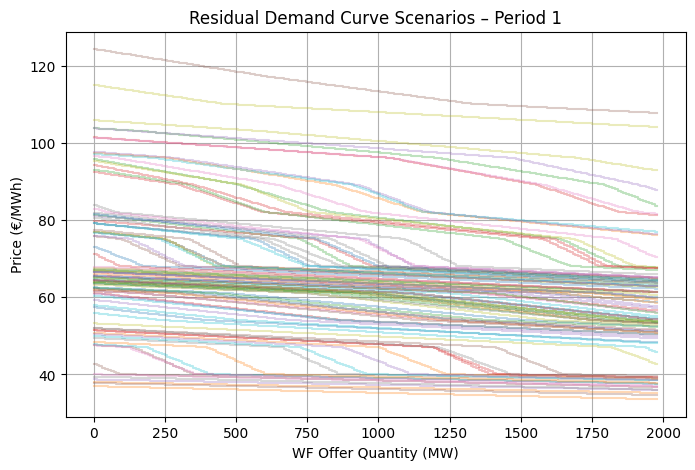

In [79]:
period = 1
plt.figure(figsize=(8,5))

for w in W:
    q_steps, p_steps = [], []

    for b in valid_blocks_by_w.get((period,w), []):
        q_low  = qini_big[(period,b,w)]
        q_high = q_low + qmax_big[(period,b,w)]
        lam    = lambda_da_big[(period,b,w)]

        # stepwise 구간 추가
        q_steps.extend([q_low, q_high])
        p_steps.extend([lam, lam])

    if p_steps:  # 빈 리스트 아니면 그림
        plt.step(q_steps, p_steps, where="post", alpha=0.3)

plt.xlabel("WF Offer Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title(f"Residual Demand Curve Scenarios – Period {period}")
plt.grid(True)
plt.show()


## 시나리오생성 4: RDC에 노이즈

In [ ]:
# rdc자체에 노이즈---------------------------
# 0) 기본 설정
# ---------------------------
W = list(range(100))   # 시나리오 수
rho_w = {w: 1/len(W) for w in W}
qini_big, qmax_big, lambda_da_big = {}, {}, {}
valid_blocks_by_w = defaultdict(list)

date_str = "20250601"
fn = f"rdcdata/filteredcurve_{date_str}.csv"

# ---------------------------
# 1) base curve (0601) 불러오기
# ---------------------------
df_base = pd.read_csv(fn, encoding="utf-8-sig")

wf_offer_grid = np.arange(0, 2000, 10)
B = 10   # stepwise block 수

def compute_rdc_by_sign_change(price_grid, demand_vals, supply_vals, wf_offers):
    rdc = []
    for q in wf_offers:
        resid = demand_vals - supply_vals - q
        idx   = np.where(np.diff(np.sign(resid)) != 0)[0]
        for i in idx:
            p0,p1 = price_grid[i], price_grid[i+1]
            r0,r1 = resid[i], resid[i+1]
            if r1 != r0:
                p_star = p0 - r0*(p1-p0)/(r1-r0)
                rdc.append((q, p_star))
    return rdc

# ---------------------------
# 2) 각 시나리오 w마다 노이즈 부여
# ---------------------------
for w in W:
    for t in range(1,25):
        df_t = df_base[df_base["Time Period"] == t]
        sup  = df_t[df_t["GC"] == "V"]
        dem  = df_t[df_t["GC"] == "C"]
        if sup.empty or dem.empty:
            continue

        # 공급/수요 집계
        s_agg = sup.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
        s_agg["Cumul"] = s_agg["Amount"].cumsum()

        d_agg = dem.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
        d_agg["Cumul"] = d_agg["Amount"][::-1].cumsum()[::-1]

        # 보간
        s_f = interp1d(s_agg["Price"], s_agg["Cumul"], kind="previous",
                       bounds_error=False, fill_value=(0, s_agg["Cumul"].iloc[-1]))
        d_f = interp1d(d_agg["Price"], d_agg["Cumul"], kind="previous",
                       bounds_error=False, fill_value=(d_agg["Cumul"].iloc[0], 0))

        price_grid = np.linspace(min(s_agg["Price"].min(), d_agg["Price"].min()),
                                 max(s_agg["Price"].max(), d_agg["Price"].max()), 500)
        sv, dv = s_f(price_grid), d_f(price_grid)

        # RDC 계산
        rdc_pts = compute_rdc_by_sign_change(price_grid, dv, sv, wf_offer_grid)
        if not rdc_pts:
            continue
        qv, pv = zip(*rdc_pts)

        # stepwise 근사
        q_breaks = np.linspace(min(qv), max(qv), B+1)

        for b in range(B):
            q_low, q_high = q_breaks[b], q_breaks[b+1]
            mask = (np.array(qv) >= q_low) & (np.array(qv) < q_high)
            if not mask.any():
                continue

            lam = np.mean(np.array(pv)[mask])

            # ---- 노이즈 부여 ----
            qini_w = max(0, q_low * (1 + np.random.normal(0, 0.02)))   # ±2% 수량
            qmax_w = max(0, (q_high - q_low) * (1 + np.random.normal(0, 0.02)))
            lam_w  = lam + np.random.normal(0, 0.5)                    # ±0.5 €/MWh 가격

            qini_big[(t,b,w)]      = qini_w
            qmax_big[(t,b,w)]      = qmax_w
            lambda_da_big[(t,b,w)] = lam_w

            if qmax_w > 0:
                valid_blocks_by_w[(t,w)].append(b)

    # 블록 정리
    for t in range(1,25):
        valid_blocks_by_w[(t,w)] = sorted(set(valid_blocks_by_w[(t,w)]))

print("✅ 0601 filteredcurve 기반 RDC stepwise noise 시나리오 생성 완료")
print("예시:", list(lambda_da_big.items())[:5])


✅ 0601 filteredcurve 기반 RDC stepwise noise 시나리오 생성 완료
예시: [((1, 0, 0), 65.94811153691712), ((1, 1, 0), 64.39960447314347), ((1, 2, 0), 65.40075581438997), ((1, 3, 0), 63.76132056158621), ((1, 4, 0), 63.47881390682404)]


In [ ]:
# # ---------------------------
# # 0) 기본 설정
# # ---------------------------
# W = list(range(100))   # 시나리오 수
# rho_w = {w: 1/len(W) for w in W}
# qini_big, qmax_big, lambda_da_big = {}, {}, {}
# valid_blocks_by_w = defaultdict(list)

# date_str = "20250601"
# fn = f"rdcdata/filteredcurve_{date_str}.csv"

# # ---------------------------
# # 1) base curve (0601) 불러오기
# # ---------------------------
# df_base = pd.read_csv(fn, encoding="utf-8-sig")

# wf_offer_grid = np.arange(0, 2000, 10)
# B = 10   # stepwise block 수

# def compute_rdc_by_sign_change(price_grid, demand_vals, supply_vals, wf_offers):
#     rdc = []
#     for q in wf_offers:
#         resid = demand_vals - supply_vals - q
#         idx   = np.where(np.diff(np.sign(resid)) != 0)[0]
#         for i in idx:
#             p0,p1 = price_grid[i], price_grid[i+1]
#             r0,r1 = resid[i], resid[i+1]
#             if r1 != r0:
#                 p_star = p0 - r0*(p1-p0)/(r1-r0)
#                 rdc.append((q, p_star))
#     return rdc

# # ---------------------------
# # 2) 각 시나리오 w마다 노이즈 부여
# # ---------------------------
# for w in W:
#     for t in range(1,25):
#         df_t = df_base[df_base["Time Period"] == t]
#         sup  = df_t[df_t["GC"] == "V"]
#         dem  = df_t[df_t["GC"] == "C"]
#         if sup.empty or dem.empty:
#             continue

#         # 공급/수요 집계
#         s_agg = sup.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
#         s_agg["Cumul"] = s_agg["Amount"].cumsum()

#         d_agg = dem.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
#         d_agg["Cumul"] = d_agg["Amount"][::-1].cumsum()[::-1]

#         # 보간
#         s_f = interp1d(s_agg["Price"], s_agg["Cumul"], kind="previous",
#                        bounds_error=False, fill_value=(0, s_agg["Cumul"].iloc[-1]))
#         d_f = interp1d(d_agg["Price"], d_agg["Cumul"], kind="previous",
#                        bounds_error=False, fill_value=(d_agg["Cumul"].iloc[0], 0))

#         price_grid = np.linspace(min(s_agg["Price"].min(), d_agg["Price"].min()),
#                                  max(s_agg["Price"].max(), d_agg["Price"].max()), 500)
#         sv, dv = s_f(price_grid), d_f(price_grid)

#         # RDC 계산
#         rdc_pts = compute_rdc_by_sign_change(price_grid, dv, sv, wf_offer_grid)
#         if not rdc_pts:
#             continue
#         qv, pv = zip(*rdc_pts)

#         # stepwise 근사
#         q_breaks = np.linspace(min(qv), max(qv), B+1)

#         for b in range(B):
#             q_low, q_high = q_breaks[b], q_breaks[b+1]
#             mask = (np.array(qv) >= q_low) & (np.array(qv) < q_high)
#             if not mask.any():
#                 continue

#             lam = np.mean(np.array(pv)[mask])

#             # ---- 노이즈 부여 ----
#             qini_w = max(0, q_low * (1 + np.random.normal(0, 0.02)))   # ±2% 수량
#             qmax_w = max(0, (q_high - q_low) * (1 + np.random.normal(0, 0.02)))
#             lam_w  = lam + np.random.normal(0, 0.5)                    # ±0.5 €/MWh 가격

#             qini_big[(t,b,w)]      = qini_w
#             qmax_big[(t,b,w)]      = qmax_w
#             lambda_da_big[(t,b,w)] = lam_w

#             if qmax_w > 0:
#                 valid_blocks_by_w[(t,w)].append(b)

#     # 블록 정리
#     for t in range(1,25):
#         valid_blocks_by_w[(t,w)] = sorted(set(valid_blocks_by_w[(t,w)]))

# print("✅ 0601 filteredcurve 기반 RDC stepwise noise 시나리오 생성 완료")
# print("예시:", list(lambda_da_big.items())[:5])


✅ 0601 filteredcurve 기반 RDC stepwise noise 시나리오 생성 완료
예시: [((1, 0, 0), 65.94736356183705), ((1, 1, 0), 65.6201370286079), ((1, 2, 0), 63.588788528270115), ((1, 3, 0), 63.13057670766504), ((1, 4, 0), 62.93393473979132)]


In [ ]:
# 단조로 시나리오생성

# ---- PAV: 단조감소(least-squares) 보정 함수 ----
def isotonic_decreasing(y):
    # PAV for nonincreasing sequence (least-squares projection)
    # 구현: 증가 단조에 PAV 적용하려면 -y로 increasing 적용 후 다시 부호 복구
    y = np.asarray(y, dtype=float)
    # pool-adjacent-violators for increasing on -y
    vals = -y.copy()
    n = len(vals)
    w = np.ones(n)
    i = 0
    while i < n - 1:
        if vals[i] > vals[i+1] + 1e-12:  # increasing 위반(여기선 -y 기준)
            # pool 뒤로 확장
            j = i
            while j >= 0 and vals[j] > vals[j+1] + 1e-12:
                # merge block j..i+1
                total_w = w[j] + w[j+1]
                avg = (w[j]*vals[j] + w[j+1]*vals[j+1]) / total_w
                vals[j] = avg
                w[j] = total_w
                # shift 왼쪽으로 압축
                vals = np.delete(vals, j+1)
                w    = np.delete(w,    j+1)
                n -= 1
                j -= 1
            # 재분배(평평한 블럭을 원래 길이로 확장)
            # 위 merge 후 전체를 다시 펼치기 위해 아래에서 다시 빌드
            # 간단화를 위해 블록 재구성 루틴 사용
            # 재구성
            y_rec = []
            for vv, ww in zip(vals, w):
                y_rec.extend([vv]*int(ww))
            vals = np.array(y_rec, dtype=float)
            w    = np.ones_like(vals)
            n = len(vals)
            i = 0
        else:
            i += 1
    return -vals  # 부호 복구(비감소 -> 비감소 of -y == 비감소 of (-y) => 비감소, 복구하면 비감소 of -(-y)=비감소? 여기선 최종 -vals가 비감소가 아니라 '비증가'임

# ---- 기본 설정 ----
W = list(range(100))
rho_w = {w: 1/len(W) for w in W}
qini_big, qmax_big, lambda_da_big = {}, {}, {}
valid_blocks_by_w = defaultdict(list)

date_str = "20250601"
df_base = pd.read_csv(f"rdcdata/filteredcurve_{date_str}.csv", encoding="utf-8-sig")

wf_offer_grid = np.arange(0, 2000, 10)
B = 100  # 블록 수

def compute_rdc_by_sign_change(price_grid, demand_vals, supply_vals, wf_offers):
    rdc = []
    for q in wf_offers:
        resid = demand_vals - supply_vals - q
        idx   = np.where(np.diff(np.sign(resid)) != 0)[0]
        for i in idx:
            p0,p1 = price_grid[i], price_grid[i+1]
            r0,r1 = resid[i], resid[i+1]
            if r1 != r0:
                p_star = p0 - r0*(p1-p0)/(r1-r0)
                rdc.append((q, p_star))
    return rdc

# ---- 1) 0601에서 base stepwise 추출 (가격은 단조감소) ----
base_blocks = {}  # (t) -> list of (q_low, q_high, lam_base) sorted by q_low
for t in range(1,25):
    sub = df_base[df_base["Time Period"] == t]
    sup = sub[sub["GC"] == "V"]
    dem = sub[sub["GC"] == "C"]
    if sup.empty or dem.empty:
        continue

    s_agg = sup.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
    s_agg["Cumul"] = s_agg["Amount"].cumsum()

    d_agg = dem.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
    d_agg["Cumul"] = d_agg["Amount"][::-1].cumsum()[::-1]

    s_f = interp1d(s_agg["Price"], s_agg["Cumul"], kind="previous",
                   bounds_error=False, fill_value=(0, s_agg["Cumul"].iloc[-1]))
    d_f = interp1d(d_agg["Price"], d_agg["Cumul"], kind="previous",
                   bounds_error=False, fill_value=(d_agg["Cumul"].iloc[0], 0))

    price_grid = np.linspace(min(s_agg["Price"].min(), d_agg["Price"].min()),
                             max(s_agg["Price"].max(), d_agg["Price"].max()), 500)
    sv, dv = s_f(price_grid), d_f(price_grid)

    pts = compute_rdc_by_sign_change(price_grid, dv, sv, wf_offer_grid)
    if not pts:
        continue
    qv, pv = map(np.array, zip(*pts))
    q_breaks = np.linspace(qv.min(), qv.max(), B+1)

    blocks = []
    for b in range(B):
        q_low, q_high = q_breaks[b], q_breaks[b+1]
        mask = (qv >= q_low) & (qv < q_high)
        if not mask.any():
            # 빈 블록은 스킵
            continue
        lam_base = float(np.mean(pv[mask]))
        blocks.append((float(q_low), float(q_high), lam_base))
    base_blocks[t] = blocks  # 이미 q_low 오름차순

# ---- 2) 시나리오 생성: λ에 노이즈 + 단조감소 보정 (q 구간은 그대로) ----
sigma_lambda = 0.5  # €/MWh 표준편차 (원하면 조절)
for w in W:
    for t, blocks in base_blocks.items():
        if not blocks:
            continue
        q_lows  = [q0 for (q0, q1, lam) in blocks]
        q_highs = [q1 for (q0, q1, lam) in blocks]
        lam0    = np.array([lam for (q0, q1, lam) in blocks], dtype=float)

        lam_noisy = lam0 + np.random.normal(0, sigma_lambda, size=len(lam0))
        # 단조감소(비증가) 강제
        lam_mono = isotonic_decreasing(lam_noisy)

        # 저장
        for b,(q0,q1,_) in enumerate(blocks):
            qini_big[(t,b,w)]      = q0
            qmax_big[(t,b,w)]      = max(0.0, q1 - q0)
            lambda_da_big[(t,b,w)] = float(lam_mono[b])
            if q1 > q0:
                valid_blocks_by_w[(t,w)].append(b)

    # 정리
    for t in base_blocks.keys():
        valid_blocks_by_w[(t,w)] = sorted(set(valid_blocks_by_w[(t,w)]))


In [6]:
base_date = "20250601"


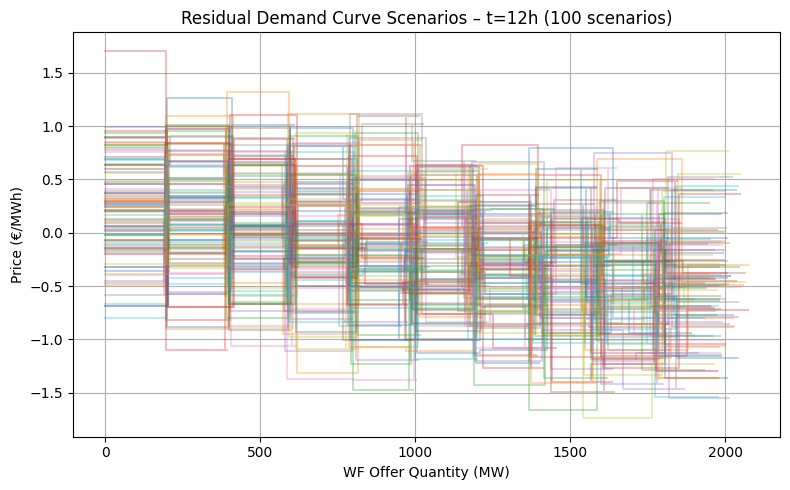

In [75]:
# ---- 특정 시간대 시각화 (예: t=12시) ----
t_view = 12

plt.figure(figsize=(8,5))
for w in W:
    qvals = []
    pvals = []
    for b in valid_blocks_by_w.get((t_view,w), []):
        q0 = qini_big[(t_view,b,w)]
        q1 = q0 + qmax_big[(t_view,b,w)]
        lam = lambda_da_big[(t_view,b,w)]
        qvals.extend([q0, q1])
        pvals.extend([lam, lam])
    if qvals:  # 해당 시나리오 데이터가 있으면 그림
        plt.step(qvals, pvals, where="post", alpha=0.3)

plt.xlabel("WF Offer Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title(f"Residual Demand Curve Scenarios – t={t_view}h (100 scenarios)")
plt.grid(True)
plt.tight_layout()
plt.show()

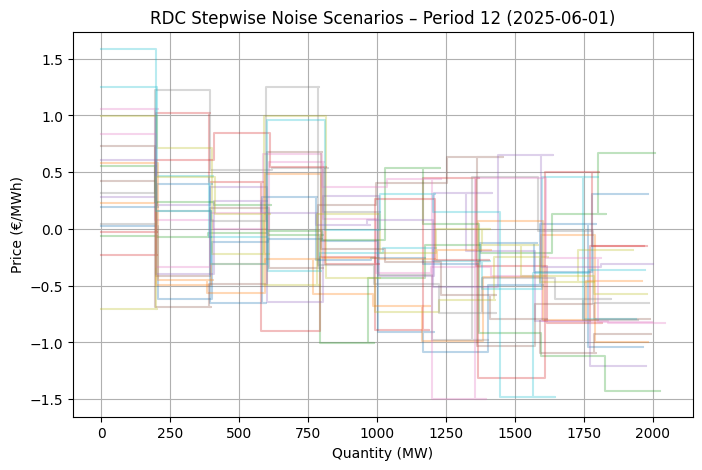

In [16]:
period = 12
plt.figure(figsize=(8,5))

for w in W[:20]:  # 앞 20개 시나리오만 표시
    q_steps, p_steps = [], []
    for b in valid_blocks_by_w[(period,w)]:
        q_low  = qini_big[(period,b,w)]
        q_high = q_low + qmax_big[(period,b,w)]
        lam    = lambda_da_big[(period,b,w)]
        q_steps.extend([q_low, q_high])
        p_steps.extend([lam, lam])
    plt.step(q_steps, p_steps, where="post", alpha=0.3)

plt.xlabel("Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title(f"RDC Stepwise Noise Scenarios – Period {period} (2025-06-01)")
plt.grid(True)
plt.show()


In [5]:
df_pwf = pd.read_csv("co2freegeneration_filled.csv", sep=",")
df_pwf["datetime"] = pd.to_datetime(df_pwf["datetime"])
df_pwf["date"] = df_pwf["datetime"].dt.date
df_pwf["hour"] = df_pwf["datetime"].dt.hour

date_pd = pd.to_datetime(base_date)
sub_pwf = df_pwf[df_pwf["date"] == date_pd.date()]
pwf_base = {int(row["hour"])+1: row["value"]/20 for _,row in sub_pwf.iterrows()}

rt_files = sorted(glob.glob("rtdata/marginalpibc_2025*.1"))
fmatch = [f for f in rt_files if base_date in f]
df_rt = pd.read_csv(fmatch[0], sep=";", encoding="latin-1", skiprows=1, header=None)
df_rt = df_rt.dropna(how="all", axis=1)
df_rt.columns = ["Year","Month","Day","Period","Price1","Price2"][:df_rt.shape[1]]
df_rt = df_rt.dropna(subset=["Period","Price1"])
df_rt["Period"] = df_rt["Period"].astype(int)
rt_base = {}
for _, row in df_rt.iterrows():
    period = int(row["Period"])
    t = (period-1)//4 + 1
    j = (period-1)%4 + 1
    rt_base[(t,j)] = float(row["Price1"])/4

In [ ]:
# ---------------------------
# 1) 시나리오 개수와 확률
# ---------------------------
W = list(range(100))
rho_w = {w: 1/len(W) for w in W}

# ---------------------------
# 2) 큰 딕셔너리 초기화
# ---------------------------
qini_big, qmax_big, lambda_da_big = {}, {}, {}
pwf_big, rt_big = {}, {}
valid_blocks_by_w = defaultdict(list)

# ---------------------------
# 3) 발전량 시나리오 생성 (노이즈)
# ---------------------------
for w in W:
    for t,v in pwf_base.items():
        noise = np.random.normal(0, 0.05)
        pwf_big[(0,t,w)] = max(0, v*(1+noise))

# ---------------------------
# 4) 실시간 가격 시나리오 생성 (노이즈)
# ---------------------------
for w in W:
    for (t,j),v in rt_base.items():
        noise = np.random.normal(0, 2)
        rt_big[(t,j,w)] = max(0, v+noise)

# ---------------------------
# 5) RDC 시나리오 생성 (stepwise + noise + 단조감소 보정)
# ---------------------------
# for w in W:
#     for t in range(1,25):
#         df_t = df_base[df_base["Time Period"] == t]
#         sup  = df_t[df_t["GC"] == "V"]
#         dem  = df_t[df_t["GC"] == "C"]
#         if sup.empty or dem.empty:
#             continue

#         # 공급·수요 누적 곡선
#         s_agg = sup.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
#         s_agg["Cumul"] = s_agg["Amount"].cumsum()
#         d_agg = dem.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
#         d_agg["Cumul"] = d_agg["Amount"][::-1].cumsum()[::-1]

#         # 노이즈
#         noise_s = np.random.normal(0, 0.005, len(s_agg))
#         noise_d = np.random.normal(0, 0.005, len(d_agg))
#         s_cumul = (s_agg["Cumul"].values * (1+noise_s)).clip(min=0)
#         d_cumul = (d_agg["Cumul"].values * (1+noise_d)).clip(min=0)

#         # 보간
#         s_f = interp1d(s_agg["Price"], s_cumul, kind="previous",
#                        bounds_error=False, fill_value=(0, s_cumul[-1]))
#         d_f = interp1d(d_agg["Price"], d_cumul, kind="previous",
#                        bounds_error=False, fill_value=(d_cumul[0], 0))
#         price_grid = np.linspace(min(s_agg["Price"].min(), d_agg["Price"].min()),
#                                  max(s_agg["Price"].max(), d_agg["Price"].max()), 500)
#         sv, dv = s_f(price_grid), d_f(price_grid)

#         # RDC 계산
#         rdc_pts = compute_rdc_by_sign_change(price_grid, dv, sv, wf_offer_grid)
#         if not rdc_pts:
#             continue
#         qv, pv = zip(*rdc_pts)

#         # stepwise 근사
#         q_breaks = np.linspace(min(qv), max(qv), B+1)
#         for b in range(B):
#             q_low, q_high = q_breaks[b], q_breaks[b+1]
#             mask = (np.array(qv) >= q_low) & (np.array(qv) < q_high)
#             if not mask.any():
#                 continue

#             qini_big[(t,b,w)]      = q_low
#             qmax_big[(t,b,w)]      = q_high - q_low
#             lambda_da_big[(t,b,w)] = np.mean(np.array(pv)[mask])

#             if qmax_big[(t,b,w)] > 0:
#                 valid_blocks_by_w[(t,w)].append(b)

#     # 블록 정리
#     for t in range(1,25):
#         valid_blocks_by_w[(t,w)] = sorted(set(valid_blocks_by_w[(t,w)]))

# ---------------------------
# 6) 결과 확인
# ---------------------------
print("총 시나리오 수:", len(W))
print("발전량 예시:", list(pwf_big.items())[:3])
print("실시간 가격 예시:", list(rt_big.items())[:6])
print("RDC 예시:", list(lambda_da_big.items())[:5])


총 시나리오 수: 100
발전량 예시: [((0, 1, 0), 974.3241684754398), ((0, 2, 0), 856.2150522806156), ((0, 3, 0), 879.725881051445)]
실시간 가격 예시: [((1, 1, 0), 19.950066464223003), ((1, 2, 0), 14.760674755661146), ((1, 3, 0), 8.832481179741288), ((1, 4, 0), 8.370158178104012), ((2, 1, 0), 11.789113668012664), ((2, 2, 0), 10.393296224190053)]
RDC 예시: []


In [14]:
# ---------------------------
# 5) RDC 시나리오 생성 (stepwise + noise)
# ---------------------------
for w in W:
    for t in range(1,25):
        df_t = df_base[df_base["Time Period"] == t]
        sup  = df_t[df_t["GC"] == "V"]
        dem  = df_t[df_t["GC"] == "C"]
        if sup.empty or dem.empty:
            continue

        # 공급·수요 집계
        s_agg = sup.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
        s_agg["Cumul"] = s_agg["Amount"].cumsum()

        d_agg = dem.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
        d_agg["Cumul"] = d_agg["Amount"][::-1].cumsum()[::-1]

        # 보간
        s_f = interp1d(s_agg["Price"], s_agg["Cumul"], kind="previous",
                       bounds_error=False, fill_value=(0, s_agg["Cumul"].iloc[-1]))
        d_f = interp1d(d_agg["Price"], d_agg["Cumul"], kind="previous",
                       bounds_error=False, fill_value=(d_agg["Cumul"].iloc[0], 0))

        price_grid = np.linspace(min(s_agg["Price"].min(), d_agg["Price"].min()),
                                 max(s_agg["Price"].max(), d_agg["Price"].max()), 500)
        sv, dv = s_f(price_grid), d_f(price_grid)

        # RDC 계산
        rdc_pts = compute_rdc_by_sign_change(price_grid, dv, sv, wf_offer_grid)
        if not rdc_pts:
            continue
        qv, pv = zip(*rdc_pts)

        # stepwise 근사
        q_breaks = np.linspace(min(qv), max(qv), B+1)

        for b in range(B):
            q_low, q_high = q_breaks[b], q_breaks[b+1]
            mask = (np.array(qv) >= q_low) & (np.array(qv) < q_high)
            if not mask.any():
                continue

            lam = np.mean(np.array(pv)[mask])

            # ---- 노이즈 부여 ----
            qini_w = max(0, q_low * (1 + np.random.normal(0, 0.02)))   # ±2% 수량
            qmax_w = max(0, (q_high - q_low) * (1 + np.random.normal(0, 0.02)))
            lam_w  = lam + np.random.normal(0, 0.5)                    # ±0.5 €/MWh 가격

            qini_big[(t,b,w)]      = qini_w
            qmax_big[(t,b,w)]      = qmax_w
            lambda_da_big[(t,b,w)] = lam_w

            if qmax_w > 0:
                valid_blocks_by_w[(t,w)].append(b)

    # 블록 정리
    for t in range(1,25):
        valid_blocks_by_w[(t,w)] = sorted(set(valid_blocks_by_w[(t,w)]))


In [15]:
print("총 시나리오 수:", len(W))
print("발전량 예시:", list(pwf_big.items())[:3])
print("실시간 가격 예시:", list(rt_big.items())[:6])
print("RDC 예시:", list(lambda_da_big.items())[:5])

총 시나리오 수: 100
발전량 예시: [((0, 1, 0), 974.3241684754398), ((0, 2, 0), 856.2150522806156), ((0, 3, 0), 879.725881051445)]
실시간 가격 예시: [((1, 1, 0), 19.950066464223003), ((1, 2, 0), 14.760674755661146), ((1, 3, 0), 8.832481179741288), ((1, 4, 0), 8.370158178104012), ((2, 1, 0), 11.789113668012664), ((2, 2, 0), 10.393296224190053)]
RDC 예시: [((1, 0, 0), 66.12627778404148), ((1, 1, 0), 64.95688043938247), ((1, 2, 0), 64.62573953669725), ((1, 3, 0), 63.50079538035162), ((1, 4, 0), 63.06506704592467)]


## 시나리오 5: 수요공급에 uniform으로

수요공급 컨텍스트

In [52]:
base_date = "20250601"
fn_base   = f"rdcdata/filteredcurve_{base_date}.csv"

# 기준일 원본 곡선 불러오기
df_base = pd.read_csv(fn_base, encoding="utf-8-sig")

# 저장 디렉토리 생성
out_dir = f"scenariosuniform_{base_date}"
os.makedirs(out_dir, exist_ok=True)

num_scenarios = 100  # 시나리오 개수
noise_level = 0.2   # ±5%

for w in range(num_scenarios):
    df_scen = []
    for period in range(1,25):
        sub = df_base[df_base["Time Period"] == period]
        if sub.empty:
            continue

        # 공급/수요 따로 분리
        sup = sub[sub["GC"]=="V"].copy()
        dem = sub[sub["GC"]=="C"].copy()
        eps = np.random.normal(0, 0.1)  # 공통 충격
        # Uniform 노이즈 주기 (±5%)
        sup["Amount"] = sup["Amount"] * (1  + eps + np.random.uniform(-noise_level, noise_level, len(sup)))
        dem["Amount"] = dem["Amount"] * (1 - eps + np.random.uniform(-noise_level, noise_level, len(dem)))

        # 결과 합치기
        df_scen.append(pd.concat([sup,dem]))

    # concat 후 CSV 저장
    df_out = pd.concat(df_scen).reset_index(drop=True)
    out_path = os.path.join(out_dir, f"curve_scen{w:03d}.csv")
    df_out.to_csv(out_path, index=False, encoding="utf-8-sig")

print(f"✅ {num_scenarios}개 시나리오 생성 완료 (uniform noise) → {out_dir}")


✅ 100개 시나리오 생성 완료 (uniform noise) → scenariosuniform_20250601


좀더 의미있게 시나리오

In [18]:
base_date = "20250601"
fn_base   = f"rdcdata/filteredcurve_{base_date}.csv"

# 기준일 원본 곡선 불러오기
df_base = pd.read_csv(fn_base, encoding="utf-8-sig")

# 저장 디렉토리 생성
out_dir = f"scenariosuniform_{base_date}"
os.makedirs(out_dir, exist_ok=True)
num_scenarios = 100

for w in range(num_scenarios):
    df_scen = []
    for period in range(1,25):
        sub = df_base[df_base["Time Period"] == period]
        if sub.empty:
            continue

        sup = sub[sub["GC"]=="V"].copy()
        dem = sub[sub["GC"]=="C"].copy()

        # --- 1) 공통 충격 (상관구조) ---
        eps = np.random.normal(0, 0.3)  # 더 크게

        # --- 2) Tail scenario 여부 ---
        if np.random.rand() < 0.2:   # 20%는 extreme
            noise_level = 0.2        # ±20%
        else:
            noise_level = 0.05       # ±5%

        # --- 3) 차등 노이즈 ---
        sup.loc[sup["Price"] > 60, "Amount"] *= (1 + eps + np.random.uniform(-noise_level*2, noise_level*2, len(sup.loc[sup["Price"] > 60])))
        sup.loc[sup["Price"] <= 60, "Amount"] *= (1 + eps + np.random.uniform(-noise_level, noise_level, len(sup.loc[sup["Price"] <= 60])))

        dem["Amount"] = dem["Amount"] * (1 - eps + np.random.uniform(-noise_level, noise_level, len(dem)))

        # --- 4) Extreme scenario 직접 삽입 ---
        if w % 25 == 0:  # 매 25번째
            sup["Amount"] *= 0.5
            dem["Amount"] *= 1.3

        df_scen.append(pd.concat([sup,dem]))

    df_out = pd.concat(df_scen).reset_index(drop=True)
    out_path = os.path.join(out_dir, f"curve_scen{w:03d}.csv")
    df_out.to_csv(out_path, index=False, encoding="utf-8-sig")


찐 유니폼

In [42]:
base_date = "20250601"
fn_base   = f"rdcdata/filteredcurve_{base_date}.csv"

# 기준일 원본 곡선 불러오기
df_base = pd.read_csv(fn_base, encoding="utf-8-sig")

# 저장 디렉토리 생성
out_dir = f"scenariosuniform_{base_date}"
os.makedirs(out_dir, exist_ok=True)

num_scenarios = 100  # 시나리오 개수
noise_level = 0.2   # ±5%

for w in range(num_scenarios):
    df_scen = []
    for period in range(1,25):
        sub = df_base[df_base["Time Period"] == period]
        if sub.empty:
            continue

        # 공급/수요 따로 분리
        sup = sub[sub["GC"]=="V"].copy()
        dem = sub[sub["GC"]=="C"].copy()

        # Uniform 노이즈 주기 (±5%)
        sup["Amount"] = sup["Amount"] * (1 + np.random.uniform(-noise_level, noise_level, len(sup)))
        dem["Amount"] = dem["Amount"] * (1 + np.random.uniform(-noise_level, noise_level, len(dem)))

        # 결과 합치기
        df_scen.append(pd.concat([sup,dem]))

    # concat 후 CSV 저장
    df_out = pd.concat(df_scen).reset_index(drop=True)
    out_path = os.path.join(out_dir, f"curve_scen{w:03d}.csv")
    df_out.to_csv(out_path, index=False, encoding="utf-8-sig")

print(f"✅ {num_scenarios}개 시나리오 생성 완료 (uniform noise) → {out_dir}")


✅ 100개 시나리오 생성 완료 (uniform noise) → scenariosuniform_20250601


시나리오 합치기

In [53]:
scenario_dir   = f"scenariosuniform_{base_date}"
scenario_files = sorted(glob.glob(os.path.join(scenario_dir, "*.csv")))
W = list(range(num_scenarios))  # 0..999
rho_w = {w: 1/len(W) for w in W}
wf_offer_grid = np.arange(0, 2000,10)
B = 200  # 블록 수
qini_big, qmax_big, lambda_da_big = {}, {}, {}
pwf_big, rt_big = {}, {}
valid_blocks_by_w = defaultdict(list)
# ---------------------------
# 시나리오별로 합치기
# ---------------------------
for w, fp in enumerate(scenario_files):
    # --- 발전량 노이즈 (Uniform ±5%) ---
    for t,v in pwf_base.items():
        noise = np.random.uniform(-0.05, 0.05)  # [-5%, +5%]
        pwf_big[(0,t,w)] = max(0, v*(1+noise))

    # --- 실시간 가격 노이즈 (Uniform ±2 €/MWh) ---
    for (t,j),v in rt_base.items():
        noise = np.random.uniform(-0.05, 0.05)  # [-10%, +10%]
        rt_big[(t,j,w)] = max(0, v*(1+noise))

    # --- S&D 곡선 → RDC 변환 ---
    df = pd.read_csv(fp, encoding="utf-8-sig")
    for t in range(1,25):
        df_t = df[df["Time Period"] == t]
        sup  = df_t[df_t["GC"] == "V"]
        dem  = df_t[df_t["GC"] == "C"]
        if sup.empty or dem.empty:
            continue

        # 집계
        s_agg = sup.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
        s_agg["Cumul"] = s_agg["Amount"].cumsum()

        d_agg = dem.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
        d_agg["Cumul"] = d_agg["Amount"][::-1].cumsum()[::-1]

        # 보간
        s_f = interp1d(s_agg["Price"], s_agg["Cumul"],
                       kind="previous", bounds_error=False, fill_value=(0,s_agg["Cumul"].iloc[-1]))
        d_f = interp1d(d_agg["Price"], d_agg["Cumul"],
                       kind="previous", bounds_error=False, fill_value=(d_agg["Cumul"].iloc[0],0))

        price_grid = np.linspace(min(s_agg["Price"].min(), d_agg["Price"].min()),
                                 max(s_agg["Price"].max(), d_agg["Price"].max()), 500)
        sv, dv = s_f(price_grid), d_f(price_grid)

        # RDC 계산
        rdc_pts = compute_rdc_by_sign_change(price_grid, dv, sv, wf_offer_grid)
        if not rdc_pts:
            continue
        qv, pv = zip(*rdc_pts)

        # stepwise 근사
        q_breaks = np.linspace(min(qv), max(qv), B+1)
        for b in range(B):
            q_low, q_high = q_breaks[b], q_breaks[b+1]
            mask = (np.array(qv) >= q_low) & (np.array(qv) < q_high)
            if not mask.any():
                continue

            qini_big[(t,b,w)]      = q_low
            qmax_big[(t,b,w)]      = q_high - q_low
            lambda_da_big[(t,b,w)] = np.mean(np.array(pv)[mask])

            if qmax_big[(t,b,w)] > 0:
                valid_blocks_by_w[(t,w)].append(b)

    # 블록 정리
    for t in range(1,25):
        valid_blocks_by_w[(t,w)] = sorted(set(valid_blocks_by_w[(t,w)]))

print(f"✅ 통합 시나리오 {len(W)}개 생성 완료 (uniform noise)")
print("예시 발전량:", list(pwf_big.items())[:3])
print("예시 가격:", list(rt_big.items())[:6])
print("예시 RDC:", list(qini_big.items())[:3])

✅ 통합 시나리오 100개 생성 완료 (uniform noise)
예시 발전량: [((0, 1, 0), 885.2536352923695), ((0, 2, 0), 884.3400460194009), ((0, 3, 0), 811.5989709688641)]
예시 가격: [((1, 1, 0), 19.93690550684156), ((1, 2, 0), 14.567944439990173), ((1, 3, 0), 8.891066799627966), ((1, 4, 0), 3.5541135173590037), ((2, 1, 0), 10.826721901120258), ((2, 2, 0), 6.480781096170367)]
예시 RDC: [((1, 0, 0), 0.0), ((1, 1, 0), 9.95), ((1, 2, 0), 19.9)]


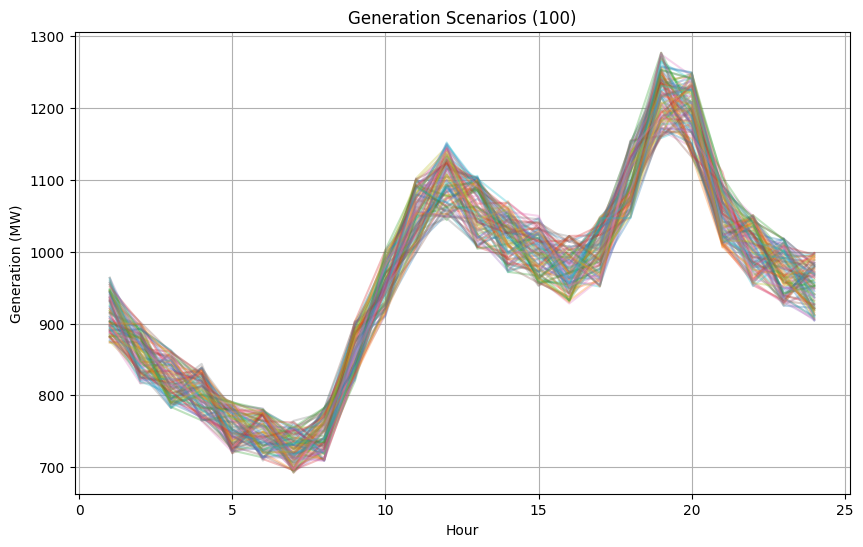

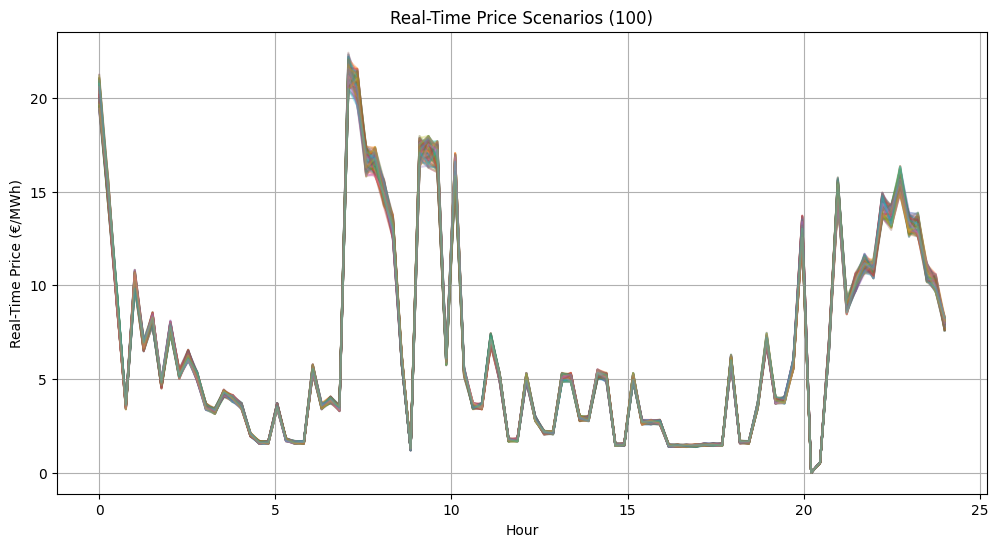

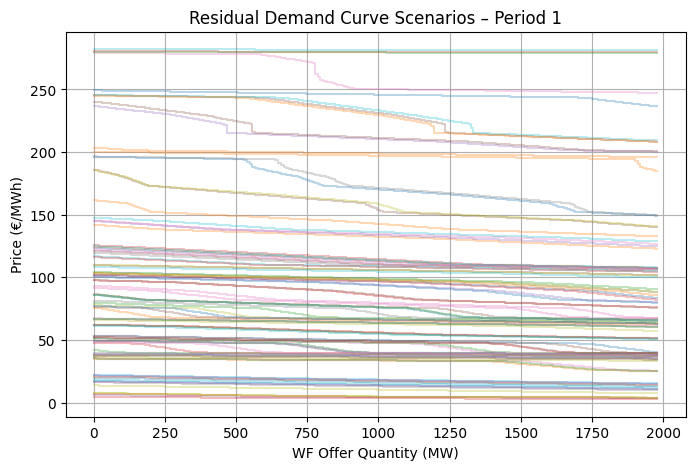

In [68]:
plt.figure(figsize=(10,6))
for w in W:
    vals = [pwf_big[(0,t,w)] for t in range(1,25)]
    plt.plot(range(1,25), vals, alpha=0.3)
plt.xlabel("Hour")
plt.ylabel("Generation (MW)")
plt.title("Generation Scenarios (100)")
plt.grid(True)
plt.show()
plt.figure(figsize=(12,6))
for w in W:
    vals = [rt_big[(t,j,w)] for t in range(1,25) for j in range(1,5)]
    plt.plot(np.linspace(0,24,len(vals)), vals, alpha=0.3)
plt.xlabel("Hour")
plt.ylabel("Real-Time Price (€/MWh)")
plt.title("Real-Time Price Scenarios (100)")
plt.grid(True)
plt.show()
period = 1
plt.figure(figsize=(8,5))

for w in W:
    q_steps, p_steps = [], []

    for b in valid_blocks_by_w.get((period,w), []):
        q_low  = qini_big[(period,b,w)]
        q_high = q_low + qmax_big[(period,b,w)]
        lam    = lambda_da_big[(period,b,w)]

        # stepwise 구간 추가
        q_steps.extend([q_low, q_high])
        p_steps.extend([lam, lam])

    if p_steps:  # 빈 리스트 아니면 그림
        plt.step(q_steps, p_steps, where="post", alpha=0.3)

plt.xlabel("WF Offer Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title(f"Residual Demand Curve Scenarios – Period {period}")
plt.grid(True)
plt.show()


ValueError: operands could not be broadcast together with shapes (1262,) (2251,) 

## 최적화 모델

In [ ]:
# valid_blocks = {t: [] for t in T}
# valid_blocks = {t: sorted(set(bs)) for t, bs in valid_blocks.items()}

In [34]:
valid_blocks = {t: [] for t in range(1,25)}
for (t,b,w), val in qmax_big.items():
    if val > 0:
        valid_blocks[t].append(b)
valid_blocks = {t: sorted(set(bs)) for t, bs in valid_blocks.items()}

In [54]:
eta_c, eta_d    = 0.9, 0.9
E0, E_min, E_max = 1400, 500, 2250
pc_max, pd_max  = 500, 500
pc_max, pd_max  = 1000, 1000

Δt = 0.25

In [55]:
S = list(range(100))                        # 시나리오 index
T = list(range(1, 25))                                  # 시간
I = [0]
J = [1,2,3,4]
Δt = 0.25
rho_w = {s: 1/len(S) for s in S}        

In [56]:
model = gp.Model("WF_ESS_3D_RDC_RT_WF")

# ---------- 1단계(H&N) ----------
u = model.addVars([(t,b) for t in T for b in valid_blocks[t]],
                  vtype=GRB.BINARY, name="u")

# qvar, p_bid도 w에 종속(DA 기대값을 w로 평균)
qvar  = model.addVars([(t,b) for t in T for b in valid_blocks[t]],
                      lb=0.0, name="qvar")
p_bid = model.addVars(T, lb=0.0, name="p_bid")

# ESS on/off (H&N)
u_c = model.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_c")
u_d = model.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_d")

# ---------- 2단계(Recourse; w별) ----------
p_c = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pc_max, name="p_c")
p_d = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pd_max, name="p_d")
E_q = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=E_min, ub=E_max, name="E_q")
p_b = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, name="p_b")

# LDR 계수(공통)
p_hat_c = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_c")
p_hat_d = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_d")
D_c     = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_c")
D_d     = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_d")

# ---------- 목적함수 ----------
# DA 수익
# DA_rev = gp.quicksum(
#     rho_w[w] * gp.quicksum(
#         lambda_da_big[(t,b,w)] * (u[t,b] * qini_big[(t,b,w)] + qvar[t,b])
#         for b in valid_blocks_by_w.get((t,w), [])
#         if (t,b,w) in lambda_da_big
#     )
#     for w in W for t in T
# )


# # RT 수익
# RT_rev = gp.quicksum(
#     rho_w[w] * gp.quicksum(
#         rt_big[(t,j,w)] * (p_b[t,j,w] - p_bid[t]/4.0)
#         for j in J if (t,j,w) in rt_big
#     )
#     for w in W for t in T
# )
# 목적함수 = DA + RT
DA_rev = gp.quicksum(
    rho_w[w] * gp.quicksum(
        lambda_da_big[(t,b,w)] * (u[t,b] * qini_big[(t,b,w)] + qvar[t,b])
        for b in valid_blocks_by_w.get((t,w), [])
        if (t,b,w) in lambda_da_big
    )
    for w in W for t in T
)

RT_rev = gp.quicksum(
    rho_w[w] * gp.quicksum(
        rt_big[(t,j,w)] * (p_b[t,j,w] - p_bid[t]/4.0)
        for j in J if (t,j,w) in rt_big
    )
    for w in W for t in T
)

model.setObjective(DA_rev + RT_rev, GRB.MAXIMIZE)# ---------- 제약식 (통일 버전) ----------
# 모든 (t,j,w)에 대해 균형
for w in W:
    for t in T:
        for j in J:
            model.addConstr(
                p_b[(t,j,w)] ==
                (gp.quicksum(pwf_big[(i,t,w)] for i in I)/4.0)   # 15분 평균 풍력
                + p_d[(t,j,w)] - p_c[(t,j,w)]                    # ESS 순발전
                - p_bid[t]/4.0,                                  # DA 약속의 1/4
                name=f"rt_balance_{t}_{j}_w{w}"
            )
# (6c) 매 시각 블록 하나 선택 (1단계 공통)
for t in T:
    model.addConstr(gp.quicksum(u[t,b] for b in valid_blocks[t]) == 1,
                    name=f"one_block_{t}")

# # (6d) qvar ≤ qmax * u  (모든 w에서 성립 → qmax_big[(t,b,w)] 사용, qvar은 w-비의존)
# for w in W:
#     for t in T:
#         for b in valid_blocks[t]:
#             model.addConstr(
#                 qvar[t,b] <= qmax_big[(t,b,w)] * u[t,b],
#                 name=f"qvar_max_{t}_{b}_w{w}"
#             )
for w in W:
    for t in T:
        for b in valid_blocks_by_w.get((t,w), []):
            model.addConstr(
                qvar[t,b] <= qmax_big[(t,b,w)] * u[t,b],
                name=f"qvar_max_{t}_{b}_w{w}"
            )

# (6e) p_bid 정의 (1단계 공통결정, 기대값 기반)
#  E[qini] = Σ_w rho_w[w] * qini_big[(t,b,w)]
# mu_qini = {(t,b): sum(rho_w[w]*qini_big[(t,b,w)] for w in W)
#            for t in T for b in valid_blocks[t]}

# for t in T:
#     model.addConstr(
#         p_bid[t] == gp.quicksum(u[t,b]*mu_qini[(t,b)] + qvar[t,b]
#                                 for b in valid_blocks[t]),
#         name=f"p_bid_def_{t}"
#     )
# (6e) p_bid 정의 (qini는 시나리오와 무관 → 첫 시나리오 값 사용)
mu_qini = {
    (t,b): sum(rho_w[w] * qini_big[(t,b,w)] for w in W if (t,b,w) in qini_big)
    for t in T for b in valid_blocks[t]
}

for t in T:
    model.addConstr(
        p_bid[t] == gp.quicksum(u[t,b]*mu_qini[(t,b)] + qvar[t,b]
                                for b in valid_blocks[t]),
        name=f"p_bid_def_{t}"
    )
# (6h, 6i) LDR (2단계, w-의존)  —— delta_rt 대신 실시간가격 rt_big 사용
#     p_c = u_c * (p̂_c + D_c * λ_rt),   p_d = u_d * (p̂_d + D_d * λ_rt)
for w in W:
    for t in T:
        for j in J:
            model.addConstr(
                p_c[(t,j,w)] == u_c[(t,j)] * (p_hat_c[(t,j)] + D_c[(t,j)] * rt_big[(t,j,w)]),
                name=f"LDR_pc_{t}_{j}_w{w}"
            )
            model.addConstr(
                p_d[(t,j,w)] == u_d[(t,j)] * (p_hat_d[(t,j)] + D_d[(t,j)] * rt_big[(t,j,w)]),
                name=f"LDR_pd_{t}_{j}_w{w}"
            )

# (6k) 동시 충방전 금지 + Big-M
for t in T:
    for j in J:
        model.addConstr(u_c[(t,j)] + u_d[(t,j)] <= 1, name=f"no_simul_{t}_{j}")
        for w in W:
            model.addConstr(p_c[(t,j,w)] <= pc_max * u_c[(t,j)],
                            name=f"pc_bigm_{t}_{j}_w{w}")
            model.addConstr(p_d[(t,j,w)] <= pd_max * u_d[(t,j)],
                            name=f"pd_bigm_{t}_{j}_w{w}")

# (6j) SOC 전이 (2단계, w-의존)
for w in W:
    for t in T:
        for j in J:
            prev = (E0 if (t == 1 and j == 1)
                    else (E_q[(t-1,4,w)] if j == 1 else E_q[(t,j-1,w)]))
            model.addConstr(
                E_q[(t,j,w)] == prev + Δt*(eta_c*p_c[(t,j,w)] - p_d[(t,j,w)]/eta_d),
                name=f"SOC_{t}_{j}_w{w}"
            )

# (6g) DA vs RT 약속량 경계 (1단계 p_bid[t] vs 2단계 실현치)
#  풍력(gen) 시나리오 인덱스는 triplet_of[w][1] 이나,
#  이미 pwf_big[(i,t,w)] 로 매핑되어 있으니 그걸 그대로 사용
for w in W:
    for t in T:
        # 상한: 풍력 발전 + 방전
        rhs = 1000 + gp.quicksum(p_d[(t,j,w)] for j in J)
        # 하한: -충전
        model.addConstr(-gp.quicksum(p_c[(t,j,w)] for j in J) <= p_bid[t],
                        name=f"bid_low_{t}_w{w}")
        # 상한
        model.addConstr(p_bid[t] <= rhs, name=f"bid_up_sync_{t}_w{w}")

# 옵션 파라미터
model.Params.MIPGap = 0.00000002
# model.Params.TimeLimit = 3600
# model.Params.Heuristics = 0.1
# model.feasRelaxS(0, True, False, True)
model.optimize()
# Z_RP = model.ObjVal

Set parameter MIPGap to value 2e-08
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i9-13900K, instruction set [SSE2|AVX|AVX2]
Thread count: 24 physical cores, 32 logical processors, using up to 32 threads

Optimize a model with 67344 rows, 39480 columns and 188012 nonzeros
Model fingerprint: 0x1ea6c664
Model has 19200 quadratic constraints
Variable types: 39048 continuous, 432 integer (432 binary)
Coefficient statistics:
  Matrix range     [2e-01, 2e+03]
  QMatrix range    [5e-01, 2e+01]
  QLMatrix range   [1e+00, 1e+00]
  Objective range  [5e-03, 2e+05]
  Bounds range     [1e+00, 2e+03]
  RHS range        [1e+00, 1e+03]
Presolve removed 26781 rows and 10124 columns
Presolve time: 0.23s
Presolved: 60329 rows, 30502 columns, 189237 nonzeros
Presolved model has 764 SOS constraint(s)
Variable types: 29712 continuous, 790 integer (790 binary)

Deterministic concurrent LP optimizer: primal and dual simplex (primal and dual model)
Showing firs

In [ ]:
# # ---------- 제약식 (통일 버전) ----------
# # 모든 (t,j,w)에 대해 균형
# for w in W:
#     for t in T:
#         for j in J:
#             model.addConstr(
#                 p_b[(t,j,w)] ==
#                 (gp.quicksum(pwf_big[(i,t,w)] for i in I)/4.0)   # 15분 평균 풍력
#                 + p_d[(t,j,w)] - p_c[(t,j,w)]                    # ESS 순발전
#                 - p_bid[t]/4.0,                                  # DA 약속의 1/4
#                 name=f"rt_balance_{t}_{j}_w{w}"
#             )
# # (6c) 매 시각 블록 하나 선택 (1단계 공통)
# for t in T:
#     model.addConstr(gp.quicksum(u[t,b] for b in valid_blocks[t]) == 1,
#                     name=f"one_block_{t}")

# # # (6d) qvar ≤ qmax * u  (모든 w에서 성립 → qmax_big[(t,b,w)] 사용, qvar은 w-비의존)
# # for w in W:
# #     for t in T:
# #         for b in valid_blocks[t]:
# #             model.addConstr(
# #                 qvar[t,b] <= qmax_big[(t,b,w)] * u[t,b],
# #                 name=f"qvar_max_{t}_{b}_w{w}"
# #             )
# for w in W:
#     for t in T:
#         for b in valid_blocks_by_w.get((t,w), []):
#             model.addConstr(
#                 qvar[t,b] <= qmax_big[(t,b,w)] * u[t,b],
#                 name=f"qvar_max_{t}_{b}_w{w}"
#             )

# # (6e) p_bid 정의 (1단계 공통결정, 기대값 기반)
# #  E[qini] = Σ_w rho_w[w] * qini_big[(t,b,w)]
# # mu_qini = {(t,b): sum(rho_w[w]*qini_big[(t,b,w)] for w in W)
# #            for t in T for b in valid_blocks[t]}

# # for t in T:
# #     model.addConstr(
# #         p_bid[t] == gp.quicksum(u[t,b]*mu_qini[(t,b)] + qvar[t,b]
# #                                 for b in valid_blocks[t]),
# #         name=f"p_bid_def_{t}"
# #     )
# # (6e) p_bid 정의 (qini는 시나리오와 무관 → 첫 시나리오 값 사용)
# mu_qini = {
#     (t,b): sum(rho_w[w] * qini_big[(t,b,w)] for w in W if (t,b,w) in qini_big)
#     for t in T for b in valid_blocks[t]
# }

# for t in T:
#     model.addConstr(
#         p_bid[t] == gp.quicksum(u[t,b]*mu_qini[(t,b)] + qvar[t,b]
#                                 for b in valid_blocks[t]),
#         name=f"p_bid_def_{t}"
#     )
# # (6h, 6i) LDR (2단계, w-의존)  —— delta_rt 대신 실시간가격 rt_big 사용
# #     p_c = u_c * (p̂_c + D_c * λ_rt),   p_d = u_d * (p̂_d + D_d * λ_rt)
# for w in W:
#     for t in T:
#         for j in J:
#             model.addConstr(
#                 p_c[(t,j,w)] == u_c[(t,j)] * (p_hat_c[(t,j)] + D_c[(t,j)] * rt_big[(t,j,w)]),
#                 name=f"LDR_pc_{t}_{j}_w{w}"
#             )
#             model.addConstr(
#                 p_d[(t,j,w)] == u_d[(t,j)] * (p_hat_d[(t,j)] + D_d[(t,j)] * rt_big[(t,j,w)]),
#                 name=f"LDR_pd_{t}_{j}_w{w}"
#             )

# # (6k) 동시 충방전 금지 + Big-M
# for t in T:
#     for j in J:
#         model.addConstr(u_c[(t,j)] + u_d[(t,j)] <= 1, name=f"no_simul_{t}_{j}")
#         for w in W:
#             model.addConstr(p_c[(t,j,w)] <= pc_max * u_c[(t,j)],
#                             name=f"pc_bigm_{t}_{j}_w{w}")
#             model.addConstr(p_d[(t,j,w)] <= pd_max * u_d[(t,j)],
#                             name=f"pd_bigm_{t}_{j}_w{w}")

# # (6j) SOC 전이 (2단계, w-의존)
# for w in W:
#     for t in T:
#         for j in J:
#             prev = (E0 if (t == 1 and j == 1)
#                     else (E_q[(t-1,4,w)] if j == 1 else E_q[(t,j-1,w)]))
#             model.addConstr(
#                 E_q[(t,j,w)] == prev + Δt*(eta_c*p_c[(t,j,w)] - p_d[(t,j,w)]/eta_d),
#                 name=f"SOC_{t}_{j}_w{w}"
#             )

# # (6g) DA vs RT 약속량 경계 (1단계 p_bid[t] vs 2단계 실현치)
# #  풍력(gen) 시나리오 인덱스는 triplet_of[w][1] 이나,
# #  이미 pwf_big[(i,t,w)] 로 매핑되어 있으니 그걸 그대로 사용
# for w in W:
#     for t in T:
#         # 상한: 풍력 발전 + 방전
#         rhs = 1000 + gp.quicksum(p_d[(t,j,w)] for j in J)
#         # 하한: -충전
#         model.addConstr(-gp.quicksum(p_c[(t,j,w)] for j in J) <= p_bid[t],
#                         name=f"bid_low_{t}_w{w}")
#         # 상한
#         model.addConstr(p_bid[t] <= rhs, name=f"bid_up_sync_{t}_w{w}")

# # 옵션 파라미터
# model.Params.MIPGap = 0.00000002
# # model.Params.TimeLimit = 3600
# # model.Params.Heuristics = 0.1
# # model.feasRelaxS(0, True, False, True)
# model.optimize()
# # Z_RP = model.ObjVal

Set parameter MIPGap to value 2e-08
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i9-13900K, instruction set [SSE2|AVX|AVX2]
Thread count: 24 physical cores, 32 logical processors, using up to 32 threads

Optimize a model with 67344 rows, 39480 columns and 188012 nonzeros
Model fingerprint: 0x9d0a1c2a
Model has 19200 quadratic constraints
Variable types: 39048 continuous, 432 integer (432 binary)
Coefficient statistics:
  Matrix range     [2e-01, 2e+03]
  QMatrix range    [5e-01, 2e+01]
  QLMatrix range   [1e+00, 1e+00]
  Objective range  [5e-03, 2e+05]
  Bounds range     [1e+00, 2e+03]
  RHS range        [1e+00, 1e+03]
Presolve removed 27081 rows and 10424 columns
Presolve time: 0.24s
Presolved: 60029 rows, 30202 columns, 188637 nonzeros
Presolved model has 764 SOS constraint(s)
Variable types: 29412 continuous, 790 integer (790 binary)

Deterministic concurrent LP optimizer: primal and dual simplex (primal and dual model)
Showing firs

In [57]:
Z_SP = model.ObjVal

### VSS 구하기

In [40]:
# ---- 유효블록: 모든 시나리오에서 등장한 블록의 합집합 (RDC를 평균으로 쓸 것이므로 t별 단일 집합) ----
valid_blocks_EV = {
    t: sorted({b for (tt,b,ww) in qini_big.keys() if tt == t})
    for t in T
}

# ---- RDC 파라미터 기대값 (w에 대해 평균) ----
mu_lambda_RDC = {
    (t,b): sum(rho_w[w]*lambda_da_big[(t,b,w)] for w in W if (t,b,w) in lambda_da_big)
    for t in T for b in valid_blocks_EV[t]
}
mu_qini_RDC = {
    (t,b): sum(rho_w[w]*qini_big[(t,b,w)] for w in W if (t,b,w) in qini_big)
    for t in T for b in valid_blocks_EV[t]
}
mu_qmax_RDC = {
    (t,b): sum(rho_w[w]*qmax_big[(t,b,w)] for w in W if (t,b,w) in qmax_big)
    for t in T for b in valid_blocks_EV[t]
}


In [148]:
# def build_and_solve_EV_RDC():
#     m = gp.Model("EV_RDC_only")

#     # 1단계 (RDC 관련 변수는 t,b만)
#     u_ev    = m.addVars([(t,b) for t in T for b in valid_blocks_EV[t]], vtype=GRB.BINARY, name="u")
#     qvar_ev = m.addVars([(t,b) for t in T for b in valid_blocks_EV[t]], lb=0.0, name="qvar")
#     p_bid_ev= m.addVars(T, lb=0.0, name="p_bid")

#     # ESS on/off (공통)
#     u_c_ev = m.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_c")
#     u_d_ev = m.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_d")

#     # 2단계 (w-의존)
#     p_c_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pc_max, name="p_c")
#     p_d_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pd_max, name="p_d")
#     E_q_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=E_min, ub=E_max, name="E_q")
#     p_b_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, name="p_b")

#     # LDR 계수(공통)
#     p_hat_c_ev = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_c")
#     p_hat_d_ev = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_d")
#     D_c_ev     = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_c")
#     D_d_ev     = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_d")

#     # ---- 목적함수 ----
#     # DA (RDC만 기대값 사용: w에 대한 합 필요 없음)
#     DA_rev_EV = gp.quicksum(
#         mu_lambda_RDC[(t,b)] * (u_ev[t,b]*mu_qini_RDC[(t,b)] + qvar_ev[t,b])
#         for t in T for b in valid_blocks_EV[t] if (t,b) in mu_lambda_RDC
#     )

#     # RT (여전히 w 시나리오 평균)
#     RT_rev_EV = gp.quicksum(
#         rho_w[w] * gp.quicksum(
#             rt_big[(t,j,w)] * (p_b_ev[t,j,w] - p_bid_ev[t]/4.0)
#             for t in T for j in J if (t,j,w) in rt_big
#         ) for w in W
#     )

#     m.setObjective(DA_rev_EV + RT_rev_EV, GRB.MAXIMIZE)

#     # ---- 제약식 ----
#     # (i) RT 균형
#     for w in W:
#         for t in T:
#             for j in J:
#                 m.addConstr(
#                     p_b_ev[t,j,w] ==
#                     (gp.quicksum(pwf_big[(i,t,w)] for i in I)/4.0) + p_d_ev[t,j,w] - p_c_ev[t,j,w]
#                     - p_bid_ev[t]/4.0,
#                     name=f"bal_EV_{t}_{j}_w{w}"
#                 )

#     # (ii) t마다 하나의 RDC 블록 선택
#     for t in T:
#         m.addConstr(gp.quicksum(u_ev[t,b] for b in valid_blocks_EV[t]) == 1, name=f"one_block_EV_{t}")

#     # (iii) qvar ≤ μ(qmax) * u  (EV에서는 파라미터도 평균 사용)
#     for t in T:
#         for b in valid_blocks_EV[t]:
#             if (t,b) in mu_qmax_RDC:
#                 m.addConstr(qvar_ev[t,b] <= mu_qmax_RDC[(t,b)] * u_ev[t,b],
#                             name=f"qvar_mu_qmax_EV_{t}_{b}")

#     # (iv) p_bid 정의 (μ(qini) 사용)
#     for t in T:
#         m.addConstr(
#             p_bid_ev[t] == gp.quicksum(u_ev[t,b]*mu_qini_RDC[(t,b)] + qvar_ev[t,b]
#                                        for b in valid_blocks_EV[t] if (t,b) in mu_qini_RDC),
#             name=f"p_bid_def_EV_{t}"
#         )

#     # (v) LDR: p_c, p_d = u_* (p_hat + D * λ_rt)
#     for w in W:
#         for t in T:
#             for j in J:
#                 lam_rt = rt_big[(t,j,w)]
#                 m.addConstr(p_c_ev[t,j,w] == u_c_ev[t,j] * (p_hat_c_ev[t,j] + D_c_ev[t,j]*lam_rt),
#                             name=f"LDRc_EV_{t}_{j}_w{w}")
#                 m.addConstr(p_d_ev[t,j,w] == u_d_ev[t,j] * (p_hat_d_ev[t,j] + D_d_ev[t,j]*lam_rt),
#                             name=f"LDRd_EV_{t}_{j}_w{w}")

#     # (vi) 동시충방전 금지 + Big-M
#     for t in T:
#         for j in J:
#             m.addConstr(u_c_ev[t,j] + u_d_ev[t,j] <= 1, name=f"no_simul_EV_{t}_{j}")
#             for w in W:
#                 m.addConstr(p_c_ev[t,j,w] <= pc_max * u_c_ev[t,j], name=f"pcM_EV_{t}_{j}_w{w}")
#                 m.addConstr(p_d_ev[t,j,w] <= pd_max * u_d_ev[t,j], name=f"pdM_EV_{t}_{j}_w{w}")

#     # (vii) SOC
#     for w in W:
#         for t in T:
#             for j in J:
#                 prev = (E0 if (t == 1 and j == 1) else (E_q_ev[t-1,4,w] if j == 1 else E_q_ev[t,j-1,w]))
#                 m.addConstr(
#                     E_q_ev[t,j,w] == prev + Δt*(eta_c*p_c_ev[t,j,w] - p_d_ev[t,j,w]/eta_d),
#                     name=f"SOC_EV_{t}_{j}_w{w}"
#                 )

#     # (viii) p_bid 경계 (네가 쓰던 버전 유지)
#     # (viii) p_bid 경계 (네가 쓰던 버전 유지)
#     for w in W:
#         for t in T:
#             rhs = 1000 + gp.quicksum(p_d_ev[t,j,w] for j in J)   # 방전 합계
#             m.addConstr(-gp.quicksum(p_c_ev[t,j,w] for j in J) <= p_bid_ev[t],
#                         name=f"bid_low_EV_{t}_w{w}")
#             m.addConstr(p_bid_ev[t] <= rhs,
#                         name=f"bid_up_EV_{t}_w{w}")

#     # 파라미터
#     m.Params.MIPGap = 0.00000002
#     m.optimize()

#     sol = {
#         "Z_EV"     : m.objVal,
#         "u"        : m.getAttr("x", u_ev),
#         "qvar"     : m.getAttr("x", qvar_ev),
#         "p_bid"    : m.getAttr("x", p_bid_ev),
#         "u_c"      : m.getAttr("x", u_c_ev),
#         "u_d"      : m.getAttr("x", u_d_ev),
#         "p_hat_c"  : m.getAttr("x", p_hat_c_ev),
#         "p_hat_d"  : m.getAttr("x", p_hat_d_ev),
#         "D_c"      : m.getAttr("x", D_c_ev),
#         "D_d"      : m.getAttr("x", D_d_ev),
#     }
#     return sol


In [45]:
mu_lq_RDC = {
    (t,b): sum(rho_w[w] * lambda_da_big[(t,b,w)] * qini_big[(t,b,w)]
               for w in W if (t,b,w) in lambda_da_big and (t,b,w) in qini_big)
    for t in T for b in valid_blocks_EV[t]
}

In [ ]:
#2
def build_and_solve_EV_RDC():
    m = gp.Model("EV_RDC_only")

    # ---------- 블록 집합(시나리오 비의존) ----------
    # valid_blocks_EV 는 valid_blocks 와 동일해야 함
    # valid_blocks_EV[t] 가 없다면 valid_blocks[t] 를 그대로 쓰세요.
    assert all(t in valid_blocks_EV for t in T)

    # ---------- 0) qmax '최악치' 사전 계산 (RP/EV/EEV 모두 동일하게) ----------
    # qmax_worst[(t,b)] = min_w qmax[(t,b,w)]
    qmax_worst = {
        (t,b): min(qmax_big[(t,b,w)] for w in W if (t,b,w) in qmax_big)
        for t in T for b in valid_blocks_EV[t]
    }

    # ---------- 1단계 ----------
    u_ev     = m.addVars([(t,b) for t in T for b in valid_blocks_EV[t]], vtype=GRB.BINARY, name="u")
    qvar_ev  = m.addVars([(t,b) for t in T for b in valid_blocks_EV[t]], lb=0.0, name="qvar")
    p_bid_ev = m.addVars(T, lb=0.0, name="p_bid")

    # ESS on/off (공통)
    u_c_ev = m.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_c")
    u_d_ev = m.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_d")

    # ---------- 2단계 ----------
    p_c_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pc_max, name="p_c")
    p_d_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pd_max, name="p_d")
    E_q_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=E_min, ub=E_max, name="E_q")
    p_b_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, name="p_b")

    # LDR 계수(공통)
    p_hat_c_ev = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_c")
    p_hat_d_ev = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_d")
    D_c_ev     = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_c")
    D_d_ev     = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_d")

    # ---------- 목적함수 ----------
    # DA (RDC만 평균)
    # EV 목적함수: E[λ·qini] 직접 사용
    DA_rev_EV = gp.quicksum(
        mu_lq_RDC[(t,b)] * u_ev[t,b] + mu_lambda_RDC[(t,b)] * qvar_ev[t,b]
        for t in T for b in valid_blocks_EV[t]
    )

    # DA_rev_EV = gp.quicksum(
    #     mu_lambda_RDC[(t,b)] * (u_ev[t,b]*mu_qini_RDC[(t,b)] + qvar_ev[t,b])
    #     for t in T for b in valid_blocks_EV[t]
    # )
    # RT (w-시나리오)
    RT_rev_EV = gp.quicksum(
        rho_w[w] * gp.quicksum(
            rt_big[(t,j,w)] * (p_b_ev[t,j,w] - p_bid_ev[t]/4.0)
            for t in T for j in J
        )
        for w in W
    )
    m.setObjective(DA_rev_EV + RT_rev_EV, GRB.MAXIMIZE)

    # ---------- 제약 ----------
    # (i) 실시간 균형
    for w in W:
        for t in T:
            for j in J:
                m.addConstr(
                    p_b_ev[t,j,w] ==
                    (gp.quicksum(pwf_big[(i,t,w)] for i in I)/4.0) + p_d_ev[t,j,w] - p_c_ev[t,j,w]
                    - p_bid_ev[t]/4.0,
                    name=f"bal_EV_{t}_{j}_w{w}"
                )

    # (ii) t마다 블록 하나
    for t in T:
        m.addConstr(gp.quicksum(u_ev[t,b] for b in valid_blocks_EV[t]) == 1, name=f"one_block_EV_{t}")

    # (iii) qvar 상한 — ★ 세 모델 공통: 최악치로 통일 ★
    for t in T:
        for b in valid_blocks_EV[t]:
            m.addConstr(qvar_ev[t,b] <= qmax_worst[(t,b)] * u_ev[t,b], name=f"qvar_worst_EV_{t}_{b}")

    # (iv) p_bid 정의 — μ(qini)
    for t in T:
        m.addConstr(
            p_bid_ev[t] == gp.quicksum(u_ev[t,b]*mu_qini_RDC[(t,b)] + qvar_ev[t,b]
                                       for b in valid_blocks_EV[t]),
            name=f"p_bid_def_EV_{t}"
        )

    # (v) LDR
    for w in W:
        for t in T:
            for j in J:
                lam_rt = rt_big[(t,j,w)]
                m.addConstr(p_c_ev[t,j,w] == u_c_ev[t,j]*(p_hat_c_ev[t,j] + D_c_ev[t,j]*lam_rt),
                            name=f"LDRc_EV_{t}_{j}_w{w}")
                m.addConstr(p_d_ev[t,j,w] == u_d_ev[t,j]*(p_hat_d_ev[t,j] + D_d_ev[t,j]*lam_rt),
                            name=f"LDRd_EV_{t}_{j}_w{w}")

    # (vi) 동시충방전 금지 + Big-M
    for t in T:
        for j in J:
            m.addConstr(u_c_ev[t,j] + u_d_ev[t,j] <= 1, name=f"no_simul_EV_{t}_{j}")
            for w in W:
                m.addConstr(p_c_ev[t,j,w] <= pc_max * u_c_ev[t,j], name=f"pcM_EV_{t}_{j}_w{w}")
                m.addConstr(p_d_ev[t,j,w] <= pd_max * u_d_ev[t,j], name=f"pdM_EV_{t}_{j}_w{w}")

    # (vii) SOC
    for w in W:
        for t in T:
            for j in J:
                prev = (E0 if (t == 1 and j == 1) else (E_q_ev[t-1,4,w] if j == 1 else E_q_ev[t,j-1,w]))
                m.addConstr(E_q_ev[t,j,w] == prev + Δt*(eta_c*p_c_ev[t,j,w] - p_d_ev[t,j,w]/eta_d),
                            name=f"SOC_EV_{t}_{j}_w{w}")

    # (viii) p_bid 경계
    for w in W:
        for t in T:
            m.addConstr(-gp.quicksum(p_c_ev[t,j,w] for j in J) <= p_bid_ev[t], name=f"bid_low_EV_{t}_w{w}")
            m.addConstr(p_bid_ev[t] <= 1000 + gp.quicksum(p_d_ev[t,j,w] for j in J),
                        name=f"bid_up_EV_{t}_w{w}")

    # ---------- 풀기 ----------
    m.Params.MIPGap = 2e-8
    m.optimize()

    return {
        "model": m,
        "Z_EV": m.objVal,
        "u": m.getAttr("x", u_ev),
        "qvar": m.getAttr("x", qvar_ev),
        "p_bid": m.getAttr("x", p_bid_ev),
        "u_c": m.getAttr("x", u_c_ev),
        "u_d": m.getAttr("x", u_d_ev),
        "p_hat_c": m.getAttr("x", p_hat_c_ev),
        "p_hat_d": m.getAttr("x", p_hat_d_ev),
        "D_c": m.getAttr("x", D_c_ev),
        "D_d": m.getAttr("x", D_d_ev),
        "qmax_worst": qmax_worst,  # EEV/RP에서도 동일 사용
    }


In [47]:
def evaluate_EEV_RDC(ev_sol):
    # ev_sol: build_and_solve_EV_RDC()가 반환한 dict
    # 필요 키: "u","qvar","p_bid","u_c","u_d","p_hat_c","p_hat_d","D_c","D_d"

    m = gp.Model("EEV_RDC_only_clean")

    # ---------- 2단계 변수만 ----------
    p_c = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pc_max, name="p_c")
    p_d = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pd_max, name="p_d")
    E_q = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=E_min, ub=E_max, name="E_q")
    p_b = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, name="p_b")

    # ---------- 목적함수 ----------
    # DA: 시나리오별 λ·qini로 EV 1단계 해를 평가
    DA_eval = gp.quicksum(
        rho_w[w] * gp.quicksum(
            lambda_da_big[(t,b,w)] * (ev_sol["u"][(t,b)] * qini_big[(t,b,w)] + ev_sol["qvar"][(t,b)])
            for b in valid_blocks_by_w.get((t,w), [])
            if (t,b,w) in lambda_da_big
        )
        for w in W for t in T
    )

    # RT: p_bid는 EV 해의 값을 상수로 사용
    RT_eval = gp.quicksum(
        rho_w[w] * gp.quicksum(
            rt_big[(t,j,w)] * (p_b[(t,j,w)] - ev_sol["p_bid"][t] / 4.0)
            for j in J
        )
        for w in W for t in T
    )

    m.setObjective(DA_eval + RT_eval, GRB.MAXIMIZE)

    # ---------- 제약 ----------
    # (1) 실시간 전력균형
    for w in W:
        for t in T:
            for j in J:
                m.addConstr(
                    p_b[(t,j,w)] ==
                    (gp.quicksum(pwf_big[(i,t,w)] for i in I) / 4.0)
                    + p_d[(t,j,w)] - p_c[(t,j,w)]
                    - ev_sol["p_bid"][t] / 4.0,
                    name=f"bal_{t}_{j}_w{w}"
                )

    # (2) LDR (EV 해 고정)
    for w in W:
        for t in T:
            for j in J:
                lam_rt = rt_big[(t,j,w)]
                m.addConstr(
                    p_c[(t,j,w)] ==
                    ev_sol["u_c"][(t,j)] * (ev_sol["p_hat_c"][(t,j)] + ev_sol["D_c"][(t,j)] * lam_rt),
                    name=f"LDRc_{t}_{j}_w{w}"
                )
                m.addConstr(
                    p_d[(t,j,w)] ==
                    ev_sol["u_d"][(t,j)] * (ev_sol["p_hat_d"][(t,j)] + ev_sol["D_d"][(t,j)] * lam_rt),
                    name=f"LDRd_{t}_{j}_w{w}"
                )

    # (3) SOC
    for w in W:
        for t in T:
            for j in J:
                prev = (E0 if (t == 1 and j == 1) else (E_q[(t-1,4,w)] if j == 1 else E_q[(t,j-1,w)]))
                m.addConstr(
                    E_q[(t,j,w)] == prev + Δt * (eta_c * p_c[(t,j,w)] - p_d[(t,j,w)] / eta_d),
                    name=f"SOC_{t}_{j}_w{w}"
                )

    # (4) DA-RT 연계 경계 (EV와 동일 형태, p_bid 상수)
    for w in W:
        for t in T:
            m.addConstr(-gp.quicksum(p_c[(t,j,w)] for j in J) <= ev_sol["p_bid"][t], name=f"bid_low_{t}_w{w}")
            m.addConstr(ev_sol["p_bid"][t] <= 1000 + gp.quicksum(p_d[(t,j,w)] for j in J),
                        name=f"bid_up_{t}_w{w}")

    m.Params.MIPGap = 2e-8
    m.optimize()
    return m.objVal


In [49]:
def evaluate_EEV_RDC(ev_sol, qmax_worst):
    """
    ev_sol: build_and_solve_EV_RDC()가 반환한 dict
    필요 키: "u","qvar","p_bid","u_c","u_d","p_hat_c","p_hat_d","D_c","D_d"
    qmax_worst: build_and_solve_EV_RDC()에서 같이 반환한 dict
    """

    m = gp.Model("EEV_RDC_only_with_worst")

    # ---------- 2단계 변수만 ----------
    p_c = m.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pc_max, name="p_c")
    p_d = m.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pd_max, name="p_d")
    E_q = m.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=E_min, ub=E_max, name="E_q")
    p_b = m.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, name="p_b")

    # ---------- 목적함수 ----------
    # DA: 시나리오별 λ·qini로 EV 1단계 해를 평가
    DA_eval = gp.quicksum(
        rho_w[w] * gp.quicksum(
            lambda_da_big[(t,b,w)] *
            (ev_sol["u"][(t,b)] * qini_big[(t,b,w)] + ev_sol["qvar"][(t,b)])
            for b in valid_blocks_by_w.get((t,w), [])
            if (t,b,w) in lambda_da_big
        )
        for w in W for t in T
    )

    # RT: p_bid는 EV 해의 값을 상수로 사용
    RT_eval = gp.quicksum(
        rho_w[w] * gp.quicksum(
            rt_big[(t,j,w)] * (p_b[(t,j,w)] - ev_sol["p_bid"][t] / 4.0)
            for j in J
        )
        for w in W for t in T
    )

    m.setObjective(DA_eval + RT_eval, GRB.MAXIMIZE)

    # ---------- 제약 ----------
    # (1) 실시간 전력균형
    for w in W:
        for t in T:
            for j in J:
                m.addConstr(
                    p_b[(t,j,w)] ==
                    (gp.quicksum(pwf_big[(i,t,w)] for i in I) / 4.0)
                    + p_d[(t,j,w)] - p_c[(t,j,w)]
                    - ev_sol["p_bid"][t] / 4.0,
                    name=f"bal_{t}_{j}_w{w}"
                )

    # (2) LDR (EV 해 고정)
    for w in W:
        for t in T:
            for j in J:
                lam_rt = rt_big[(t,j,w)]
                m.addConstr(
                    p_c[(t,j,w)] ==
                    ev_sol["u_c"][(t,j)] *
                    (ev_sol["p_hat_c"][(t,j)] + ev_sol["D_c"][(t,j)] * lam_rt),
                    name=f"LDRc_{t}_{j}_w{w}"
                )
                m.addConstr(
                    p_d[(t,j,w)] ==
                    ev_sol["u_d"][(t,j)] *
                    (ev_sol["p_hat_d"][(t,j)] + ev_sol["D_d"][(t,j)] * lam_rt),
                    name=f"LDRd_{t}_{j}_w{w}"
                )

    # (3) SOC
    for w in W:
        for t in T:
            for j in J:
                prev = (E0 if (t == 1 and j == 1)
                        else (E_q[(t-1,4,w)] if j == 1 else E_q[(t,j-1,w)]))
                m.addConstr(
                    E_q[(t,j,w)] == prev + Δt * (eta_c * p_c[(t,j,w)] - p_d[(t,j,w)] / eta_d),
                    name=f"SOC_{t}_{j}_w{w}"
                )

    # (4) qvar ≤ qmax_worst * u (EV와 동일 제약 반영)
    for t in T:
        for b in valid_blocks_EV[t]:
            if (t,b) in qmax_worst:
                m.addConstr(ev_sol["qvar"][(t,b)] <= qmax_worst[(t,b)] * ev_sol["u"][(t,b)],
                            name=f"qvar_worstF_{t}_{b}")

    # (5) DA-RT 연계 경계 (EV와 동일)
    for w in W:
        for t in T:
            m.addConstr(-gp.quicksum(p_c[(t,j,w)] for j in J) <= ev_sol["p_bid"][t],
                        name=f"bid_low_{t}_w{w}")
            m.addConstr(ev_sol["p_bid"][t] <= 1000 + gp.quicksum(p_d[(t,j,w)] for j in J),
                        name=f"bid_up_{t}_w{w}")

    m.Params.MIPGap = 2e-8
    m.optimize()
    return m.objVal


In [52]:
def evaluate_EEV_RDC(ev_sol, qmax_worst):
    m = gp.Model("EEV_RDC_only_clean")

    # ---------- 2단계 변수만 ----------
    p_c = m.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pc_max, name="p_c")
    p_d = m.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pd_max, name="p_d")
    E_q = m.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=E_min, ub=E_max, name="E_q")
    p_b = m.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, name="p_b")

    # ---------- 목적함수 ----------
    DA_eval = gp.quicksum(
        rho_w[w] * gp.quicksum(
            lambda_da_big[(t,b,w)] *
            (ev_sol["u"][(t,b)] * qini_big[(t,b,w)] + ev_sol["qvar"][(t,b)])
            for b in valid_blocks_by_w.get((t,w), [])
            if (t,b,w) in lambda_da_big
        )
        for w in W for t in T
    )

    RT_eval = gp.quicksum(
        rho_w[w] * gp.quicksum(
            rt_big[(t,j,w)] * (p_b[(t,j,w)] - ev_sol["p_bid"][t]/4.0)
            for j in J
        )
        for w in W for t in T
    )

    m.setObjective(DA_eval + RT_eval, GRB.MAXIMIZE)

    # ---------- 제약 ----------
    # (1) 실시간 전력균형
    for w in W:
        for t in T:
            for j in J:
                m.addConstr(
                    p_b[(t,j,w)] ==
                    (gp.quicksum(pwf_big[(i,t,w)] for i in I)/4.0)
                    + p_d[(t,j,w)] - p_c[(t,j,w)]
                    - ev_sol["p_bid"][t]/4.0,
                    name=f"bal_{t}_{j}_w{w}"
                )

    # (2) LDR (EV 해 고정)
    for w in W:
        for t in T:
            for j in J:
                lam_rt = rt_big[(t,j,w)]
                m.addConstr(
                    p_c[(t,j,w)] ==
                    ev_sol["u_c"][(t,j)] * (ev_sol["p_hat_c"][(t,j)] + ev_sol["D_c"][(t,j)]*lam_rt),
                    name=f"LDRc_{t}_{j}_w{w}"
                )
                m.addConstr(
                    p_d[(t,j,w)] ==
                    ev_sol["u_d"][(t,j)] * (ev_sol["p_hat_d"][(t,j)] + ev_sol["D_d"][(t,j)]*lam_rt),
                    name=f"LDRd_{t}_{j}_w{w}"
                )

    # (3) SOC
    for w in W:
        for t in T:
            for j in J:
                prev = (E0 if (t==1 and j==1) else (E_q[(t-1,4,w)] if j==1 else E_q[(t,j-1,w)]))
                m.addConstr(
                    E_q[(t,j,w)] == prev + Δt*(eta_c*p_c[(t,j,w)] - p_d[(t,j,w)]/eta_d),
                    name=f"SOC_{t}_{j}_w{w}"
                )

    # (4) DA-RT 연계
    for w in W:
        for t in T:
            m.addConstr(-gp.quicksum(p_c[(t,j,w)] for j in J) <= ev_sol["p_bid"][t],
                        name=f"bid_low_{t}_w{w}")
            m.addConstr(ev_sol["p_bid"][t] <= 1000 + gp.quicksum(p_d[(t,j,w)] for j in J),
                        name=f"bid_up_{t}_w{w}")

    m.Params.MIPGap = 2e-8
    m.optimize()
    return m.objVal


In [43]:
# def evaluate_EEV_RDC(ev_sol):
#     m = gp.Model("EEV_RDC_only")

#     # 1단계/공통 변수 (원래 SP와 동일한 index를 쓰되 EV 해로 고정)
#     # u, qvar 는 t,b (여기서 b 집합은 union 기반 valid_blocks_EV 사용)
#     u_fix    = m.addVars([(t,b) for t in T for b in valid_blocks_EV[t]], vtype=GRB.BINARY, name="u")
#     qvar_fix = m.addVars([(t,b) for t in T for b in valid_blocks_EV[t]], lb=0.0, name="qvar")
#     p_bid_fix= m.addVars(T, lb=0.0, name="p_bid")

#     u_c_fix  = m.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_c")
#     u_d_fix  = m.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_d")
#     p_hat_cF = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_c")
#     p_hat_dF = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_d")
#     D_cF     = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_c")
#     D_dF     = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_d")

#     # 2단계 (w-의존)
#     p_cF = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pc_max, name="p_c")
#     p_dF = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pd_max, name="p_d")
#     E_qF = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=E_min, ub=E_max, name="E_q")
#     p_bF = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, name="p_b")

#     # ---- 목적함수 (원래 SP와 동일: RDC는 시나리오별) ----
#     DA_rev = gp.quicksum(
#         rho_w[w] * gp.quicksum(
#             lambda_da_big[(t,b,w)] * (u_fix[t,b]*qini_big[(t,b,w)] + qvar_fix[t,b])
#             forA t in T
#             for b in valid_blocks_by_w.get((t,w), [])
#             if (t,b,w) in lambda_da_big
#         ) for w in W
#     )
#     RT_rev = gp.quicksum(
#         rho_w[w] * gp.quicksum(
#             rt_big[(t,j,w)] * (p_bF[t,j,w] - p_bid_fix[t]/4.0)
#             for t in T for j in J if (t,j,w) in rt_big
#         ) for w in W
#     )
#     m.setObjective(DA_rev + RT_rev, GRB.MAXIMIZE)

#     # ---- 제약식 (원래 SP와 동일) ----
#     # 균형
#     for w in W:
#         for t in T:
#             for j in J:
#                 m.addConstr(
#                     p_bF[t,j,w] ==
#                     (gp.quicksum(pwf_big[(i,t,w)] for i in I)/4.0) + p_dF[t,j,w] - p_cF[t,j,w]
#                     - p_bid_fix[t]/4.0,
#                     name=f"balF_{t}_{j}_w{w}"
#                 )
#     # 블록 하나
#     for t in T:
#         m.addConstr(gp.quicksum(u_fix[t,b] for b in valid_blocks_EV[t]) == 1, name=f"one_blockF_{t}")

#     # qvar ≤ qmax * u (여기서는 시나리오별 qmax 사용, 단 u,qvar는 w-비의존)
#     for w in W:
#         for t in T:
#             for b in valid_blocks_by_w.get((t,w), []):
#                 m.addConstr(qvar_fix[t,b] <= qmax_big[(t,b,w)] * u_fix[t,b], name=f"qvarF_{t}_{b}_w{w}")

#     # p_bid 정의 (μ(qini)로 고정 또는 qini 시나리오평균—EV에서 쓰던 것을 그대로 유지)
#     mu_qini = {(t,b): sum(rho_w[w]*qini_big[(t,b,w)] for w in W if (t,b,w) in qini_big)
#                for t in T for b in valid_blocks_EV[t]}
#     for t in T:
#         m.addConstr(p_bid_fix[t] == gp.quicksum(u_fix[t,b]*mu_qini[(t,b)] + qvar_fix[t,b]
#                                                 for b in valid_blocks_EV[t]), name=f"p_bidF_{t}")

#     # LDR
#     for w in W:
#         for t in T:
#             for j in J:
#                 lam_rt = rt_big[(t,j,w)]
#                 m.addConstr(p_cF[t,j,w] == u_c_fix[t,j]*(p_hat_cF[t,j] + D_cF[t,j]*lam_rt), name=f"LDRcF_{t}_{j}_w{w}")
#                 m.addConstr(p_dF[t,j,w] == u_d_fix[t,j]*(p_hat_dF[t,j] + D_dF[t,j]*lam_rt), name=f"LDRdF_{t}_{j}_w{w}")
#     # 동시충방전 + Big-M
#     for t in T:
#         for j in J:
#             m.addConstr(u_c_fix[t,j] + u_d_fix[t,j] <= 1, name=f"noSimF_{t}_{j}")
#             for w in W:
#                 m.addConstr(p_cF[t,j,w] <= pc_max*u_c_fix[t,j], name=f"pcMF_{t}_{j}_w{w}")
#                 m.addConstr(p_dF[t,j,w] <= pd_max*u_d_fix[t,j], name=f"pdMF_{t}_{j}_w{w}")
#     # SOC
#     for w in W:
#         for t in T:
#             for j in J:
#                 prev = (E0 if (t == 1 and j == 1) else (E_qF[t-1,4,w] if j == 1 else E_qF[t,j-1,w]))
#                 m.addConstr(E_qF[t,j,w] == prev + Δt*(eta_c*p_cF[t,j,w] - p_dF[t,j,w]/eta_d),
#                             name=f"SOCF_{t}_{j}_w{w}")

#     # ---- EV 해 고정 ----
#     for t in T:
#         for b in valid_blocks_EV[t]:
#             u_fix[t,b].LB = u_fix[t,b].UB = ev_sol["u"][(t,b)]
#             qvar_fix[t,b].LB = qvar_fix[t,b].UB = ev_sol["qvar"][(t,b)]
#     for t in T:
#         p_bid_fix[t].LB = p_bid_fix[t].UB = ev_sol["p_bid"][t]
#     for t in T:
#         for j in J:
#             u_c_fix[t,j].LB = u_c_fix[t,j].UB = ev_sol["u_c"][(t,j)]
#             u_d_fix[t,j].LB = u_d_fix[t,j].UB = ev_sol["u_d"][(t,j)]
#             p_hat_cF[t,j].LB = p_hat_cF[t,j].UB = ev_sol["p_hat_c"][(t,j)]
#             p_hat_dF[t,j].LB = p_hat_dF[t,j].UB = ev_sol["p_hat_d"][(t,j)]
#             D_cF[t,j].LB     = D_cF[t,j].UB     = ev_sol["D_c"][(t,j)]
#             D_dF[t,j].LB     = D_dF[t,j].UB     = ev_sol["D_d"][(t,j)]
#     m.Params.MIPGap = 0.00000002
#     m.optimize()
#     return m.objVal


In [60]:
# # ① 원래 SP(네가 가진 모델) 먼저 풀어서 Z_SP 확보
# model.optimize()
# Z_SP = model.objVal

# ① EV 풀기
ev_sol = build_and_solve_EV_RDC()
print("Z_EV (RDC only):", ev_sol["Z_EV"])

# ② EEV (EV로 고정한 상태에서 시나리오별 재평가)
Z_EEV_RDC = evaluate_EEV_RDC(ev_sol, ev_sol["qmax_worst"])
print("Z_EEV (RDC only):", Z_EEV_RDC)

# ③ VSS 계산
VSS = Z_SP- Z_EEV_RDC
print(f"VSS(RDC only): {VSS:.2f}")


Set parameter MIPGap to value 2e-08
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i9-13900K, instruction set [SSE2|AVX|AVX2]
Thread count: 24 physical cores, 32 logical processors, using up to 32 threads

Optimize a model with 43584 rows, 39480 columns and 140492 nonzeros
Model fingerprint: 0x943f053b
Model has 19200 quadratic constraints
Variable types: 39048 continuous, 432 integer (432 binary)
Coefficient statistics:
  Matrix range     [2e-01, 2e+03]
  QMatrix range    [5e-01, 2e+01]
  QLMatrix range   [1e+00, 1e+00]
  Objective range  [5e-03, 2e+05]
  Bounds range     [1e+00, 2e+03]
  RHS range        [1e+00, 1e+03]
Presolve removed 3021 rows and 10124 columns
Presolve time: 0.20s
Presolved: 60329 rows, 30502 columns, 189237 nonzeros
Presolved model has 764 SOS constraint(s)
Variable types: 29712 continuous, 790 integer (790 binary)

Deterministic concurrent LP optimizer: primal and dual simplex (primal and dual model)
Showing first

In [77]:
Z_SP

586559.1573348118

In [131]:
# --- RP block 합 = 1 확인 ---
for t in T:
    s = sum(u[t,b].X for b in valid_blocks[t])
    if abs(s - 1.0) > 1e-6:
        print(f"[WARN] RP block sum != 1 at t={t}: {s}")

In [ ]:
# 1) 동일 집합?
assert all(abs(sum(u[t,b].X for b in valid_blocks[t]) - 1) < 1e-6 for t in T)
assert all(abs(sum(u_ev[t,b].X for b in valid_blocks[t]) - 1) < 1e-6 for t in T)

# 2) qmax 통일(예: min_w) 적용했나?
# qvar, qv_e가 모두 qmax_worst·u 이하인지 검사

# 3) 부등식 관계
print(Z_RP, Z_EEV, Z_EV)
assert Z_RP + 1e-6 >= Z_EEV >= Z_EV - 1e-6


NameError: name 'u_ev' is not defined

In [16]:
# ④ VSS(RDC만)
VSS_RDC = Z_SP - Z_EEV_RDC
print("VSS (RDC only):", VSS_RDC)

VSS (RDC only): 3.3795367926359177e-07


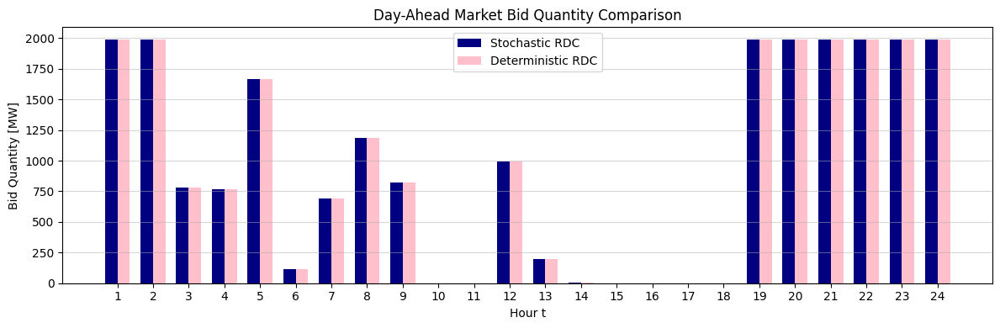

In [59]:
# ---------- p_bid 값 추출 ----------
# ---------- p_bid 값 추출 ----------
# SP (Stochastic RP 해 → Var.X 필요)
p_bid_SP = [p_bid[t].X for t in T]

# EV (Deterministic EV 해 → 이미 float 값이므로 .X 필요 없음)
p_bid_EV = [ev_sol["p_bid"][t] for t in T]
# ---------- 시각화 ----------
x = np.arange(len(T))  # 시간 축 (0~23)
width = 0.35           # 막대 폭

plt.figure(figsize=(12,4))
plt.bar(x - width/2, p_bid_SP, width, label="Stochastic RDC", color="navy")
plt.bar(x + width/2, p_bid_EV, width, label="Deterministic RDC", color="pink")

plt.xlabel("Hour t")
plt.ylabel("Bid Quantity [MW]")
plt.title("Day-Ahead Market Bid Quantity Comparison")
plt.xticks(x, T)   # x축 라벨을 Hour index로 표시
plt.legend()
plt.grid(True, axis="y", alpha=0.5)
plt.tight_layout()
plt.show()


In [21]:
DA_rev_SP_alt = sum(
    rho_w[w] * sum(lambda_da_big[(t,b,w)] * p_bid_SP[t-1]
                   for b in valid_blocks_by_w.get((t,w), [])
                   if (t,b,w) in lambda_da_big)
    for w in W for t in T
)

DA_rev_EV_alt = sum(
    rho_w[w] * sum(lambda_da_big[(t,b,w)] * p_bid_EV[t-1]
                   for b in valid_blocks_by_w.get((t,w), [])
                   if (t,b,w) in lambda_da_big)
    for w in W for t in T
)


print("DA_rev_SP:", DA_rev_SP_alt)

DA_rev_SP: 122393805.38697797


In [67]:
for w in W:
    print("DEBUG w:", w, "type:", type(w))
    break


DEBUG w: 0 type: <class 'int'>


In [70]:
print("rho_w keys example:", list(rho_w.keys())[:5])


rho_w keys example: [0, 1, 2, 3, 4]


In [94]:
# 안전한 SP 수익 계산 함수 (robust)
def compute_SP_revenue(u, qvar, p_b, p_bid,
                       lambda_da_big, qini_big, rt_big,
                       valid_blocks_by_w, rho_w,
                       T, J, W, debug=False):
    DA_rev_SP = 0.0
    RT_rev_SP = 0.0

    # helper to check if a Gurobi var exists in tupledict-like objects
    def var_exists(var_dict, key):
        try:
            _ = var_dict[key]
            return True
        except KeyError:
            return False

    for w in W:               # 시나리오
        for t in T:           # 시간 1..24
            # --- DA 수익 (시나리오별 유효블록만) ---
            bs = valid_blocks_by_w.get((t,w), [])
            if debug and len(bs) == 0:
                pass  # optionally print 빈 블록 정보
            for b in bs:
                # 1) must have (t,b,w) keys for ldc parameters
                lam = lambda_da_big.get((t,b,w))
                qin = qini_big.get((t,b,w))
                if lam is None or qin is None:
                    # 파라미터가 누락된 경우 무시
                    if debug:
                        print(f"SKIP param-missing (t,b,w): {(t,b,w)}")
                    continue

                # 2) u and qvar are 1st-stage variables keyed by (t,b)
                if not var_exists(u, (t,b)) or not var_exists(qvar, (t,b)):
                    # u or qvar 변수가 정의되지 않으면 skip
                    if debug:
                        print(f"SKIP var-missing for (t,b): {(t,b)} (w={w})")
                    continue

                # 이제 안전하게 .X 접근 가능
                u_val = u[(t,b)].X
                qvar_val = qvar[(t,b)].X

                DA_rev_SP += rho_w[w] * lam * (u_val * qin + qvar_val)

            # --- RT 수익 ---
            for j in J:
                # rt_big는 (t,j,w) -> price (float)
                val_rt = rt_big.get((t,j,w))
                if val_rt is None:
                    continue

                # p_b is defined per (t,j,w), p_bid per t
                if not var_exists(p_b, (t,j,w)):
                    if debug:
                        print(f"SKIP p_b missing {(t,j,w)}")
                    continue
                if not var_exists(p_bid, t):
                    if debug:
                        print(f"SKIP p_bid missing for t={t}")
                    continue

                pb_val = p_b[(t,j,w)].X
                p_bid_val = p_bid[t].X

                RT_rev_SP += rho_w[w] * val_rt * (pb_val - p_bid_val/4.0)

    return DA_rev_SP, RT_rev_SP

# 사용 예:
DA_rev_SP, RT_rev_SP = compute_SP_revenue(
    u=u, qvar=qvar, p_b=p_b, p_bid=p_bid,
    lambda_da_big=lambda_da_big, qini_big=qini_big, rt_big=rt_big,
    valid_blocks_by_w=valid_blocks_by_w, rho_w=rho_w,
    T=T, J=J, W=W, debug=True  # debug=True로 문제 포인트 확인 가능
)

print("DA_rev_SP:", DA_rev_SP)
print("RT_rev_SP:", RT_rev_SP)
print("Total SP obj (DA+RT):", DA_rev_SP + RT_rev_SP)


SKIP var-missing for (t,b): (1, 100) (w=0)
SKIP var-missing for (t,b): (1, 101) (w=0)
SKIP var-missing for (t,b): (1, 102) (w=0)
SKIP var-missing for (t,b): (1, 103) (w=0)
SKIP var-missing for (t,b): (1, 104) (w=0)
SKIP var-missing for (t,b): (1, 105) (w=0)
SKIP var-missing for (t,b): (1, 106) (w=0)
SKIP var-missing for (t,b): (1, 107) (w=0)
SKIP var-missing for (t,b): (1, 108) (w=0)
SKIP var-missing for (t,b): (1, 109) (w=0)
SKIP var-missing for (t,b): (1, 110) (w=0)
SKIP var-missing for (t,b): (1, 111) (w=0)
SKIP var-missing for (t,b): (1, 112) (w=0)
SKIP var-missing for (t,b): (1, 113) (w=0)
SKIP var-missing for (t,b): (1, 114) (w=0)
SKIP var-missing for (t,b): (1, 115) (w=0)
SKIP var-missing for (t,b): (1, 116) (w=0)
SKIP var-missing for (t,b): (1, 117) (w=0)
SKIP var-missing for (t,b): (1, 118) (w=0)
SKIP var-missing for (t,b): (1, 119) (w=0)
SKIP var-missing for (t,b): (1, 120) (w=0)
SKIP var-missing for (t,b): (1, 121) (w=0)
SKIP var-missing for (t,b): (1, 122) (w=0)
SKIP var-mi

In [86]:
for w in W:
    for t in T:
        for b in valid_blocks_by_w.get((t,w), []):
            if (t,b,w) not in lambda_da_big:
                print("❌ Missing in lambda:", (t,b,w))
            if (t,b,w) not in qini_big:
                print("❌ Missing in qini:", (t,b,w))

In [103]:
DA_rev_SP = 0
RT_rev_SP = 0

for w in W:
    for t in T:
        # --- DA ---
        for b in valid_blocks_by_w.get((t,w), []):
            if (t,b,w) not in lambda_da_big or (t,b,w) not in qini_big:
                continue
            lam = lambda_da_big[(t,b,w)]
            qin = qini_big[(t,b,w)]
            DA_rev_SP += rho_w[w] * lam * (u[t,b] * qin + qvar[t,b])

        # --- RT ---
        for j in J:
            if (t,j,w) not in rt_big:
                continue
            RT_rev_SP += rho_w[w] * rt_big[(t,j,w)] * (p_b[t,j,w].X - p_bid[t].X/4.0)

print("DA_rev_SP:", DA_rev_SP)
print("RT_rev_SP:", RT_rev_SP)
print("Total Obj (SP):", DA_rev_SP + RT_rev_SP)


AttributeError: Index out of range for attribute 'X'

시도햇던거

In [ ]:
# --- p_bid 비교: RP 최적해 vs EV 해 ---
p_bid_RP  = [p_bid[t].X    for t in T]   # Recourse/RP 해
p_bid_EEV = [p_bid_e[t].X  for t in T]   # EV 기반 해 (EEV 평가)

plt.figure(figsize=(10,4))
plt.plot(T, p_bid_RP,  marker="o", color="tab:blue",  label="RP Optimal Bid (p_bid)")
plt.plot(T, p_bid_EEV, marker="s", color="tab:orange",label="EV Bid (p_bid_e)")
plt.xlabel("Hour t")
plt.ylabel("Bid Quantity [MW]")
plt.title("Comparison of p_bid: RP vs EV")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

NameError: name 'p_bid_e' is not defined

In [ ]:
# VSS_RDC = Z_SP - Z_EEV_RDC
# print("VSS (RDC only):", VSS_RDC)

In [23]:
# RDC 시나리오 집합과 확률
S_rdc = W                      # 0..99 시나리오 index
rho_rdc = {w: 1/len(S_rdc) for w in S_rdc}

# μ_lambda, μ_qini, μ_qmax (기대값 계산)
mu_lambda_RDC = {
    (t,b): sum(rho_rdc[w] * lambda_da_big[(t,b,w)]
               for w in S_rdc if (t,b,w) in lambda_da_big)
    for t in T for b in valid_blocks[t]
}

mu_qini_RDC = {
    (t,b): sum(rho_rdc[w] * qini_big[(t,b,w)]
               for w in S_rdc if (t,b,w) in qini_big)
    for t in T for b in valid_blocks[t]
}

mu_qmax_RDC = {
    (t,b): sum(rho_rdc[w] * qmax_big[(t,b,w)]
               for w in S_rdc if (t,b,w) in qmax_big)
    for t in T for b in valid_blocks[t]
}


In [24]:
EV = gp.Model("EV_RDC_only")

# 1단계
u_e   = EV.addVars([(t,b) for t in T for b in valid_blocks[t]], vtype=GRB.BINARY, name="u")
qv_e  = EV.addVars([(t,b) for t in T for b in valid_blocks[t]], lb=0.0, name="qvar")
p_bid_e = EV.addVars(T, lb=0.0, name="p_bid")

u_c_e = EV.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_c")
u_d_e = EV.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_d")
p_hat_c_e = EV.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_c")
p_hat_d_e = EV.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_d")
D_c_e     = EV.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_c")
D_d_e     = EV.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_d")

# 2단계
p_c_e = EV.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pc_max, name="p_c")
p_d_e = EV.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pd_max, name="p_d")
E_e   = EV.addVars([(t,j,w) for t in T for j in J for w in W], lb=E_min, ub=E_max, name="E")
p_b_e = EV.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, name="p_b")

# 목적함수: DA는 μ(평균 RDC), RT는 시나리오
DA_ev = gp.quicksum(
    mu_lambda_RDC[(t,b)] * (u_e[t,b] * mu_qini_RDC[(t,b)] + qv_e[t,b])
    for t in T for b in valid_blocks[t]
)

RT_ev = gp.quicksum(
    rho_w[w] * gp.quicksum(
        rt_big[(t,j,w)] * (p_b_e[t,j,w] - p_bid_e[t]/4.0)
        for j in J
    )
    for w in W for t in T
)
EV.setObjective(DA_ev + RT_ev, GRB.MAXIMIZE)

# 제약식
for t in T:
    EV.addConstr(gp.quicksum(u_e[t,b] for b in valid_blocks[t]) == 1)  # 블록 하나
    EV.addConstr(p_bid_e[t] == gp.quicksum(u_e[t,b]*mu_qini_RDC[(t,b)] + qv_e[t,b]
                                           for b in valid_blocks[t]))
    for b in valid_blocks[t]:
        EV.addConstr(qv_e[t,b] <= mu_qmax_RDC[(t,b)] * u_e[t,b])

for w in W:
    for t in T:
        for j in J:
            EV.addConstr(p_c_e[t,j,w] == u_c_e[t,j]*(p_hat_c_e[t,j] + D_c_e[t,j]*rt_big[(t,j,w)]))
            EV.addConstr(p_d_e[t,j,w] == u_d_e[t,j]*(p_hat_d_e[t,j] + D_d_e[t,j]*rt_big[(t,j,w)]))
            EV.addConstr(
                p_b_e[t,j,w] ==
                (gp.quicksum(pwf_big[(i,t,w)] for i in I)/4.0) + p_d_e[t,j,w] - p_c_e[t,j,w]
                - p_bid_e[t]/4.0
            )
            prev = (E0 if (t==1 and j==1) else (E_e[(t-1,4,w)] if j==1 else E_e[(t,j-1,w)]))
            EV.addConstr(E_e[t,j,w] == prev + Δt*(eta_c*p_c_e[t,j,w] - p_d_e[t,j,w]/eta_d))
    # DA-RT 연계 경계
    for t in T:
        EV.addConstr(-gp.quicksum(p_c_e[t,j,w] for j in J) <= p_bid_e[t])
        EV.addConstr(p_bid_e[t] <= 1000 + gp.quicksum(p_d_e[t,j,w] for j in J))

EV.Params.MIPGap = 2e-8
EV.optimize()
assert EV.Status == GRB.OPTIMAL
Z_EV_RDC = EV.ObjVal


Set parameter MIPGap to value 2e-08
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i9-13900K, instruction set [SSE2|AVX|AVX2]
Thread count: 24 physical cores, 32 logical processors, using up to 32 threads

Optimize a model with 28824 rows, 48552 columns and 124580 nonzeros
Model fingerprint: 0xed3829aa
Model has 19200 quadratic constraints
Variable types: 43584 continuous, 4968 integer (4968 binary)
Coefficient statistics:
  Matrix range     [2e-01, 2e+03]
  QMatrix range    [3e-03, 3e+01]
  QLMatrix range   [1e+00, 1e+00]
  Objective range  [3e-05, 1e+05]
  Bounds range     [1e+00, 2e+03]
  RHS range        [1e+00, 1e+03]
Presolve removed 6239 rows and 14091 columns
Presolve time: 0.31s
Presolved: 41273 rows, 35613 columns, 237240 nonzeros
Presolved model has 768 SOS constraint(s)
Variable types: 30272 continuous, 5341 integer (5328 binary)
Deterministic concurrent LP optimizer: primal and dual simplex
Showing first log only...

Concurr

In [25]:
EEV = gp.Model("EEV_RDC_eval")

# 2단계 변수
p_c2 = EEV.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pc_max, name="p_c")
p_d2 = EEV.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pd_max, name="p_d")
E2   = EEV.addVars([(t,j,w) for t in T for j in J for w in W], lb=E_min, ub=E_max, name="E")
p_b2 = EEV.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, name="p_b")

# 목적함수: 실제 시나리오별 DA/RT로 평가
# DA_eval = gp.quicksum(
#     rho_w[w] * gp.quicksum(
#         lambda_da_big[(t,b,w)] * (u_e[t,b].X * mu_qini_RDC[(t,b)] + qv_e[t,b].X)
#         for b in valid_blocks_by_w.get((t,w), [])  # ★ RP와 동일 집합 사용
#         if (t,b,w) in lambda_da_big
#     )
#     for w in W for t in T
# )
DA_eval = gp.quicksum(
    rho_w[w] * gp.quicksum(
        lambda_da_big[(t,b,w)] * (u_e[t,b].X * qini_big[(t,b,w)] + qv_e[t,b].X)
        for b in valid_blocks_by_w.get((t,w), [])
        if (t,b,w) in lambda_da_big
    )
    for w in W for t in T
)

RT_eval = gp.quicksum(
    rho_w[w] * gp.quicksum(
        rt_big[(t,j,w)] * (p_b2[t,j,w] - p_bid_e[t].X/4.0)
        for j in J
    )
    for w in W for t in T
)

EEV.setObjective(DA_eval + RT_eval, GRB.MAXIMIZE)

# EV 1단계 해 고정 후 2단계 제약
for w in W:
    for t in T:
        for j in J:
            EEV.addConstr(p_c2[t,j,w] == u_c_e[t,j].X*(p_hat_c_e[t,j].X + D_c_e[t,j].X*rt_big[(t,j,w)]))
            EEV.addConstr(p_d2[t,j,w] == u_d_e[t,j].X*(p_hat_d_e[t,j].X + D_d_e[t,j].X*rt_big[(t,j,w)]))
            EEV.addConstr(
                p_b2[t,j,w] ==
                (gp.quicksum(pwf_big[(i,t,w)] for i in I)/4.0) + p_d2[t,j,w] - p_c2[t,j,w]
                - p_bid_e[t].X/4.0
            )
            prev = (E0 if (t==1 and j==1) else (E2[(t-1,4,w)] if j==1 else E2[(t,j-1,w)]))
            EEV.addConstr(E2[t,j,w] == prev + Δt*(eta_c*p_c2[t,j,w] - p_d2[t,j,w]/eta_d))
    for t in T:
        EEV.addConstr(-gp.quicksum(p_c2[t,j,w] for j in J) <= p_bid_e[t].X)
        EEV.addConstr(p_bid_e[t].X <= 1000 + gp.quicksum(p_d2[t,j,w] for j in J))

EEV.optimize()
assert EEV.Status == GRB.OPTIMAL
Z_EEV = EEV.ObjVal

print(f"Z_EV(RDC) = {Z_EV_RDC:,.2f}")
print(f"Z_EEV     = {Z_EEV:,.2f}")


Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i9-13900K, instruction set [SSE2|AVX|AVX2]
Thread count: 24 physical cores, 32 logical processors, using up to 32 threads

Optimize a model with 43200 rows, 38400 columns and 105500 nonzeros
Model fingerprint: 0x176fa6ec
Coefficient statistics:
  Matrix range     [2e-01, 1e+00]
  Objective range  [3e-05, 3e-01]
  Bounds range     [5e+02, 2e+03]
  RHS range        [6e-03, 2e+03]
Presolve removed 43200 rows and 38400 columns
Presolve time: 0.01s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.7118518e+05   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.02 seconds (0.02 work units)
Optimal objective  5.711851809e+05
Z_EV(RDC) = 571,185.18
Z_EEV     = 571,185.18


In [26]:
# RP도 이미 풀었다고 가정: Z_RP
VSS = Z_RP - Z_EEV           # 최대화 문제
eps = 1e-6
if VSS < -eps:
    print("[ALERT] VSS < 0 — 모델/평가 불일치 가능성(블록집합, 키, 시나리오 집합 확인).")
else:
    print(f"VSS = {VSS:,.2f}")


[ALERT] VSS < 0 — 모델/평가 불일치 가능성(블록집합, 키, 시나리오 집합 확인).


In [27]:
# ---------------------------
# 1) 평균 RDC (EV 모델용)
# ---------------------------
mu_lambda_RDC = {
    (t,b): sum(rho_w[w] * lambda_da_big[(t,b,w)]
               for w in W if (t,b,w) in lambda_da_big)
    for t in T for b in valid_blocks[t]
}
mu_qini_RDC = {
    (t,b): sum(rho_w[w] * qini_big[(t,b,w)]
               for w in W if (t,b,w) in qini_big)
    for t in T for b in valid_blocks[t]
}
mu_qmax_RDC = {
    (t,b): sum(rho_w[w] * qmax_big[(t,b,w)]
               for w in W if (t,b,w) in qmax_big)
    for t in T for b in valid_blocks[t]
}

# ---------------------------
# 2) EV 모델 (평균 데이터 사용)
# ---------------------------
model_EV = gp.Model("EV_model")

# 변수 (1단계만 예시 — 필요에 맞게 수정)
u_ev    = model_EV.addVars([(t,b) for t in T for b in valid_blocks[t]], vtype=GRB.BINARY, name="u")
qvar_ev = model_EV.addVars([(t,b) for t in T for b in valid_blocks[t]], lb=0.0, name="qvar")
p_bid_ev= model_EV.addVars(T, lb=0.0, name="p_bid")

# 목적함수 (DA part만 — RT는 평균가격 넣을 수 있음)
DA_rev_EV = gp.quicksum(
    mu_lambda_RDC[(t,b)] * (u_ev[t,b] * mu_qini_RDC[(t,b)] + qvar_ev[t,b])
    for t in T for b in valid_blocks[t] if (t,b) in mu_lambda_RDC
)
model_EV.setObjective(DA_rev_EV, GRB.MAXIMIZE)

model_EV.optimize()
Z_EV = model_EV.objVal
print("✅ Z_EV:", Z_EV)

# EV 해 저장 (EEV 계산에 활용)
u_sol    = model_EV.getAttr("x", u_ev)
qvar_sol = model_EV.getAttr("x", qvar_ev)
p_bid_sol= model_EV.getAttr("x", p_bid_ev)

# ---------------------------
# 3) EEV 계산 (EV 해를 모든 시나리오에 넣음)
# ---------------------------
Z_EEV = 0
for w in W:
    DA_val = gp.quicksum(
        lambda_da_big[(t,b,w)] * (u_sol[t,b] * qini_big[(t,b,w)] + qvar_sol[t,b])
        for t in T for b in valid_blocks[t]
        if (t,b,w) in lambda_da_big
    )
    RT_val = gp.quicksum(
        rt_big[(t,j,w)] * (- p_bid_sol[t]/4.0)   # ESS/RT 부분 단순화 예시
        for t in T for j in J if (t,j,w) in rt_big
    )
    Z_EEV += rho_w[w] * (DA_val.getValue() + RT_val.getValue())

print("✅ Z_EEV:", Z_EEV)

# ---------------------------
# 4) SP 모델 최적값 (Z_SP)
# ---------------------------
# 👉 이건 이미 stochastic model (원래 목적함수 DA_rev+RT_rev) 풀어서 나온 값
# model_SP = ... (기존 모델)
# model_SP.optimize()
# Z_SP = model_SP.objVal

# ---------------------------
# 5) VSS 계산
# ---------------------------
VSS = Z_RP - Z_EEV


Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i9-13900K, instruction set [SSE2|AVX|AVX2]
Thread count: 24 physical cores, 32 logical processors, using up to 32 threads

Optimize a model with 0 rows, 9576 columns and 0 nonzeros
Model fingerprint: 0x7b1139d8
Variable types: 4800 continuous, 4776 integer (4776 binary)
Coefficient statistics:
  Matrix range     [0e+00, 0e+00]
  Objective range  [2e-03, 1e+05]
  Bounds range     [1e+00, 1e+00]
  RHS range        [0e+00, 0e+00]
Found heuristic solution: objective 9.464698e+34
Presolve removed 0 rows and 4776 columns
Presolve time: 0.00s

Explored 0 nodes (0 simplex iterations) in 0.00 seconds (0.00 work units)
Thread count was 1 (of 32 available processors)

Solution count 1: 9.4647e+34 
No other solutions better than 0

Model is unbounded
Best objective 9.464697689308e+34, best bound -, gap -
✅ Z_EV: 9.464697689307622e+34
✅ Z_EEV: 9.464697689307622e+34


## 최적화모델 0930

In [98]:
valid_blocks = {t: [] for t in range(1,25)}
for (t,b,w), val in qmax_big.items():
    if val > 0:
        valid_blocks[t].append(b)
valid_blocks = {t: sorted(set(bs)) for t, bs in valid_blocks.items()}

In [99]:
eta_c, eta_d    = 0.9, 0.9
E0, E_min, E_max = 1400, 500, 2250
pc_max, pd_max  = 500, 500
# pc_max, pd_max  = 1000, 1000

Δt = 0.25

In [100]:
S = list(range(100))                        # 시나리오 index
T = list(range(1, 25))                                  # 시간
I = [0]
J = [1,2,3,4]
Δt = 0.25
rho_w = {s: 1/len(S) for s in S}        

In [ ]:
model = gp.Model("WF_ESS_3D_RDC_RT_WF")

# ---------- 1단계(H&N) ----------
u = model.addVars([(t,b) for t in T for b in valid_blocks[t]],
                  vtype=GRB.BINARY, name="u")

qvar  = model.addVars([(t,b) for t in T for b in valid_blocks[t]],
                      lb=0.0, name="qvar")
p_bid = model.addVars(T, lb=0.0, name="p_bid")

# ESS on/off (H&N)
u_c = model.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_c")
u_d = model.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_d")

# ---------- 2단계(Recourse; w별) ----------
p_c = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pc_max, name="p_c")
p_d = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pd_max, name="p_d")
E_q = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=E_min, ub=E_max, name="E_q")
p_b = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, name="p_b")

# LDR 계수(공통)
p_hat_c = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_c")
p_hat_d = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_d")
D_c     = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_c")
D_d     = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_d")

# ---------- 목적함수 ----------
DA_rev = gp.quicksum(
    rho_w[w] * gp.quicksum(
        lambda_da_big[(t,b,w)] * (u[t,b] * qini_big[(t,b,w)] + qvar[t,b])
        for b in valid_blocks_by_w.get((t,w), [])
        if (t,b,w) in lambda_da_big
    )
    for w in W for t in T
)

RT_rev = gp.quicksum(
    rho_w[w] * gp.quicksum(
        rt_big[(t,j,w)] * (p_b[(t,j,w)] - p_bid[t]/4.0)
        for j in J if (t,j,w) in rt_big
    )
    for w in W for t in T
)

model.setObjective(DA_rev + RT_rev, GRB.MAXIMIZE)

# ---------- 제약식 ----------
# (6b) 실시간 균형
for w in W:
    for t in T:
        for j in J:
            model.addConstr(
                p_b[(t,j,w)] ==
                (gp.quicksum(pwf_big[(i,t,w)] for i in I))
                + p_d[(t,j,w)] - p_c[(t,j,w)]
                - p_bid[t]/4.0,
                name=f"rt_balance_{t}_{j}_w{w}"
            )

# (6c) 매 시각 블록 하나 선택
for t in T:
    model.addConstr(gp.quicksum(u[t,b] for b in valid_blocks[t]) == 1,
                    name=f"one_block_{t}")

# # (6d) qvar 상한
# for w in W:
#     for t in T:
#         for b in valid_blocks_by_w.get((t,w), []):
#             model.addConstr(
#                 qvar[t,b] <= qmax_big[(t,b,w)] * u[t,b],
#                 name=f"qvar_max_{t}_{b}_w{w}"
#             )
# (6d) qvar 상한
for w in W:
    for t in T:
        for b in valid_blocks_by_w.get((t,w), []):
            model.addConstr(
                qvar[t,b] <= 10,
                name=f"qvar_max_{t}_{b}_w{w}"
            )
# (6e) p_bid 정의 (평균 qini 사용)
mu_qini = {
    (t,b): sum(rho_w[w]*qini_big[(t,b,w)] for w in W if (t,b,w) in qini_big)
    for t in T for b in valid_blocks[t]
}
for t in T:
    model.addConstr(
        p_bid[t] == gp.quicksum(u[t,b]*mu_qini[(t,b)] + qvar[t,b]
                                for b in valid_blocks[t]),
        name=f"p_bid_def_{t}"
    )

# (6h), (6i) LDR
for w in W:
    for t in T:
        for j in J:
            model.addConstr(
                p_c[(t,j,w)] == u_c[(t,j)] * (p_hat_c[(t,j)] + D_c[(t,j)] * rt_big[(t,j,w)]),
                name=f"LDR_pc_{t}_{j}_w{w}"
            )
            model.addConstr(
                p_d[(t,j,w)] == u_d[(t,j)] * (p_hat_d[(t,j)] + D_d[(t,j)] * rt_big[(t,j,w)]),
                name=f"LDR_pd_{t}_{j}_w{w}"
            )

# (6k) 동시 충방전 금지 + Big-M
for t in T:
    for j in J:
        model.addConstr(u_c[(t,j)] + u_d[(t,j)] <= 1, name=f"no_simul_{t}_{j}")
        for w in W:
            model.addConstr(p_c[(t,j,w)] <= pc_max * u_c[(t,j)], name=f"pc_bigm_{t}_{j}_w{w}")
            model.addConstr(p_d[(t,j,w)] <= pd_max * u_d[(t,j)], name=f"pd_bigm_{t}_{j}_w{w}")

# (6j) SOC 전이
for w in W:
    for t in T:
        for j in J:
            prev = (E0 if (t == 1 and j == 1)
                    else (E_q[(t-1,4,w)] if j == 1 else E_q[(t,j-1,w)]))
            model.addConstr(
                E_q[(t,j,w)] == prev + Δt*(eta_c*p_c[(t,j,w)] - p_d[(t,j,w)]/eta_d),
                name=f"SOC_{t}_{j}_w{w}"
            )

# (6g) DA vs RT 경계
for w in W:
    for t in T:
        rhs = gp.quicksum(pwf_big[(i,t,w)] for i in I) + gp.quicksum(p_d[(t,j,w)] for j in J)
        model.addConstr(-gp.quicksum(p_c[(t,j,w)] for j in J) <= p_bid[t],
                        name=f"bid_low_{t}_w{w}")
        model.addConstr(p_bid[t] <= rhs, name=f"bid_up_{t}_w{w}")

# (6l), (6m) 충/방전 용량 상한
for w in W:
    for t in T:
        model.addConstr(
            gp.quicksum(D_c[(t,j)] * rt_big[(t,j,w)] + p_hat_c[(t,j)] for j in J)
            <= pc_max,
            name=f"cap_charge_{t}_w{w}"
        )
        model.addConstr(
            gp.quicksum(D_d[(t,j)] * rt_big[(t,j,w)] + p_hat_d[(t,j)] for j in J)
            <= pd_max,
            name=f"cap_discharge_{t}_w{w}"
        )

# ---------- 옵션 ----------
model.Params.MIPGap = 0.005
model.optimize()
Z_RP = model.ObjVal

Set parameter MIPGap to value 0.005
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i9-13900K, instruction set [SSE2|AVX|AVX2]
Thread count: 24 physical cores, 32 logical processors, using up to 32 threads

Optimize a model with 525744 rows, 48552 columns and 668302 nonzeros
Model fingerprint: 0xce992d8f
Model has 19200 quadratic constraints
Variable types: 43584 continuous, 4968 integer (4968 binary)
Coefficient statistics:
  Matrix range     [2e-03, 2e+03]
  QMatrix range    [2e-03, 3e+01]
  QLMatrix range   [1e+00, 1e+00]
  Objective range  [2e-05, 1e+05]
  Bounds range     [1e+00, 2e+03]
  RHS range        [1e+00, 1e+03]
Presolve removed 453595 rows and 16415 columns
Presolve time: 2.40s
Presolved: 72509 rows, 32227 columns, 266583 nonzeros
Variable types: 29646 continuous, 2581 integer (2575 binary)
Found heuristic solution: objective 380225.56568

Deterministic concurrent LP optimizer: primal and dual simplex (primal and dual model)

KeyboardInterrupt: 

Exception ignored in: 'gurobipy.logcallbackstub'
Traceback (most recent call last):
  File "c:\Users\symply_jina\AppData\Local\Programs\Python\Python311\Lib\site-packages\ipykernel\iostream.py", line 608, in write
    def write(self, string: str) -> Optional[int]:  # type:ignore[override]

KeyboardInterrupt: 


  2745   558 552063.168   23  138 551115.406 554581.643  0.63%   323  660s
  2747   559 551769.482   50   96 551115.406 554581.643  0.63%   322  668s
  2748   560 552146.138   41  134 551115.406 554581.643  0.63%   322  671s
  2750   561 551179.234   88  134 551115.406 554581.643  0.63%   322  680s
  2753   563 551773.095   23  129 551115.406 554581.643  0.63%   322  687s
  2755   565 551780.571   50  133 551115.406 554581.643  0.63%   322  927s
  2757   567 554099.940   14  138 551115.406 554581.643  0.63%   333  931s
  2760   569 553629.293   13  123 551115.406 554581.643  0.63%   332  936s
  2763   571 553629.293   13  125 551115.406 554581.643  0.63%   332  940s
  2764   572 551261.127   88  126 551115.406 554581.643  0.63%   332  952s
  2766   573 551466.420   70  126 551115.406 554581.643  0.63%   332  956s


In [ ]:
def build_and_solve_EV_RDC():
    m = gp.Model("EV_RDC_only")

    # ---------- 블록 집합 ----------
    valid_blocks_EV = {
        t: sorted({b for (tt,b,ww) in qini_big.keys() if tt == t})
        for t in T
    }

    # ---------- 평균 파라미터 ----------
    mu_qini = {(t,b): sum(rho_w[w]*qini_big[(t,b,w)] for w in W if (t,b,w) in qini_big)
               for t in T for b in valid_blocks_EV[t]}
    mu_qmax = {(t,b): sum(rho_w[w]*qmax_big[(t,b,w)] for w in W if (t,b,w) in qmax_big)
               for t in T for b in valid_blocks_EV[t]}
    mu_lambda = {(t,b): sum(rho_w[w]*lambda_da_big[(t,b,w)] for w in W if (t,b,w) in lambda_da_big)
                 for t in T for b in valid_blocks_EV[t]}

    # ---------- 1단계 ----------
    u_ev     = m.addVars([(t,b) for t in T for b in valid_blocks_EV[t]], vtype=GRB.BINARY, name="u")
    qvar_ev  = m.addVars([(t,b) for t in T for b in valid_blocks_EV[t]], lb=0.0, name="qvar")
    p_bid_ev = m.addVars(T, lb=0.0, name="p_bid")

    u_c_ev = m.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_c")
    u_d_ev = m.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_d")

    # ---------- 2단계 ----------
    p_c_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pc_max, name="p_c")
    p_d_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pd_max, name="p_d")
    E_q_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=E_min, ub=E_max, name="E_q")
    p_b_ev = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, name="p_b")

    p_hat_c_ev = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_c")
    p_hat_d_ev = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_d")
    D_c_ev     = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_c")
    D_d_ev     = m.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_d")

    # ---------- 목적함수 ----------
    DA_rev_EV = gp.quicksum(
        mu_lambda[(t,b)] * (u_ev[t,b]*mu_qini[(t,b)] + qvar_ev[t,b])
        for t in T for b in valid_blocks_EV[t]
    )
    RT_rev_EV = gp.quicksum(
        rho_w[w] * gp.quicksum(
            rt_big[(t,j,w)] * (p_b_ev[t,j,w] - p_bid_ev[t]/4.0)
            for j in J
        )
        for w in W for t in T
    )
    m.setObjective(DA_rev_EV + RT_rev_EV, GRB.MAXIMIZE)

    # ---------- 제약 ----------
    # ---------- 제약 ----------

    # (0) 보조: 전역 qmax 캡(최소치) — EV라도 안전장치로 권장
    qmax_cap = {
        (t,b): min(qmax_big[(t,b,w)] for w in W if (t,b,w) in qmax_big)
        for t in T for b in valid_blocks_EV[t]
    }

    # (6b) 실시간 전력균형
    for w in W:
        for t in T:
            for j in J:
                m.addConstr(
                    p_b_ev[t,j,w] ==
                    (gp.quicksum(pwf_big[(i,t,w)] for i in I) / 4.0)  # 15분 평균 풍력
                    + p_d_ev[t,j,w] - p_c_ev[t,j,w]
                    - p_bid_ev[t]/4.0,                                # DA 약속의 1/4
                    name=f"bal_EV_{t}_{j}_w{w}"
                )

    # (6c) 매 시각 블록 하나 선택
    for t in T:
        m.addConstr(gp.quicksum(u_ev[t,b] for b in valid_blocks_EV[t]) == 1,
                    name=f"one_block_EV_{t}")

    # (6d) qvar 상한 — EV는 평균 qmax로, + 전역(min) 캡 추가(권장)
    for t in T:
        for b in valid_blocks_EV[t]:
            m.addConstr(qvar_ev[t,b] <= mu_qmax[(t,b)] * u_ev[t,b],
                        name=f"qvar_mu_EV_{t}_{b}")
            m.addConstr(qvar_ev[t,b] <= qmax_cap[(t,b)] * u_ev[t,b],
                        name=f"qvar_cap_global_EV_{t}_{b}")

    # (6e) p_bid 정의 — 평균 qini 사용
    for t in T:
        m.addConstr(
            p_bid_ev[t] == gp.quicksum(u_ev[t,b]*mu_qini[(t,b)] + qvar_ev[t,b]
                                    for b in valid_blocks_EV[t]),
            name=f"p_bid_def_EV_{t}"
        )

    # (6h),(6i) LDR (EV도 시나리오별 λ_rt를 사용)
    for w in W:
        for t in T:
            for j in J:
                lam_rt = rt_big[(t,j,w)]
                m.addConstr(
                    p_c_ev[t,j,w] == u_c_ev[t,j] * (p_hat_c_ev[t,j] + D_c_ev[t,j]*lam_rt),
                    name=f"LDRc_EV_{t}_{j}_w{w}"
                )
                m.addConstr(
                    p_d_ev[t,j,w] == u_d_ev[t,j] * (p_hat_d_ev[t,j] + D_d_ev[t,j]*lam_rt),
                    name=f"LDRd_EV_{t}_{j}_w{w}"
                )

    # (6k) 동시 충방전 금지 + Big-M 링크
    for t in T:
        for j in J:
            m.addConstr(u_c_ev[t,j] + u_d_ev[t,j] <= 1, name=f"no_simul_EV_{t}_{j}")
            for w in W:
                m.addConstr(p_c_ev[t,j,w] <= pc_max * u_c_ev[t,j], name=f"pcM_EV_{t}_{j}_w{w}")
                m.addConstr(p_d_ev[t,j,w] <= pd_max * u_d_ev[t,j], name=f"pdM_EV_{t}_{j}_w{w}")

    # (6j) SOC 전이
    for w in W:
        for t in T:
            for j in J:
                prev = (E0 if (t == 1 and j == 1)
                        else (E_q_ev[t-1,4,w] if j == 1 else E_q_ev[t,j-1,w]))
                m.addConstr(
                    E_q_ev[t,j,w] == prev + Δt*(eta_c*p_c_ev[t,j,w] - p_d_ev[t,j,w]/eta_d),
                    name=f"SOC_EV_{t}_{j}_w{w}"
                )

    # (6g) DA vs RT 약속 경계 — 상수 1000 제거, 풍력총량 사용
    for w in W:
        for t in T:
            wind_t_w = gp.quicksum(pwf_big[(i,t,w)] for i in I)
            m.addConstr(-gp.quicksum(p_c_ev[t,j,w] for j in J) <= p_bid_ev[t],
                        name=f"bid_low_EV_{t}_w{w}")
            m.addConstr(p_bid_ev[t] <= wind_t_w + gp.quicksum(p_d_ev[t,j,w] for j in J),
                        name=f"bid_up_EV_{t}_w{w}")

    # (6l),(6m) LDR-기인 설비용량 상한 (시나리오별 λ_rt에 대해 항상)
    for w in W:
        for t in T:
            m.addConstr(
                gp.quicksum(D_c_ev[t,j]*rt_big[(t,j,w)] + p_hat_c_ev[t,j] for j in J) <= pc_max,
                name=f"cap_charge_EV_{t}_w{w}"
            )
            m.addConstr(
                gp.quicksum(D_d_ev[t,j]*rt_big[(t,j,w)] + p_hat_d_ev[t,j] for j in J) <= pd_max,
                name=f"cap_discharge_EV_{t}_w{w}"
            )

    # (6n) SOC bounds는 변수 생성 시 lb/ub로 이미 반영됨
    # (권장) LDR 계수에 현실적 상한도 추가해 유연성 과다 방지
    for t in T:
        for j in J:
            m.addConstr(p_hat_c_ev[t,j] <= pc_max, name=f"p_hat_c_cap_EV_{t}_{j}")
            m.addConstr(p_hat_d_ev[t,j] <= pd_max, name=f"p_hat_d_cap_EV_{t}_{j}")
            m.addConstr(D_c_ev[t,j] <= pc_max,     name=f"D_c_cap_EV_{t}_{j}")
            m.addConstr(D_d_ev[t,j] <= pd_max,     name=f"D_d_cap_EV_{t}_{j}")


    m.Params.MIPGap = 0.005
    m.optimize()

    return {
        "model": m,
        "Z_EV": m.objVal,
        "u": m.getAttr("x", u_ev),
        "qvar": m.getAttr("x", qvar_ev),
        "p_bid": m.getAttr("x", p_bid_ev),
        "u_c": m.getAttr("x", u_c_ev),
        "u_d": m.getAttr("x", u_d_ev),
        "p_hat_c": m.getAttr("x", p_hat_c_ev),
        "p_hat_d": m.getAttr("x", p_hat_d_ev),
        "D_c": m.getAttr("x", D_c_ev),
        "D_d": m.getAttr("x", D_d_ev),
    }


In [ ]:
def evaluate_EEV_RDC(ev_sol):
    m = gp.Model("EEV_RDC_only")

    # 2단계 변수
    p_c = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pc_max, name="p_c")
    p_d = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, ub=pd_max, name="p_d")
    E_q = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=E_min, ub=E_max, name="E_q")
    p_b = m.addVars([(t,j,w) for t in T for j in J for w in W], lb=0.0, name="p_b")

    # DA profit (고정된 EV해 사용)
    DA_eval = gp.quicksum(
        rho_w[w] * gp.quicksum(
            lambda_da_big[(t,b,w)] *
            (ev_sol["u"][(t,b)] * qini_big[(t,b,w)] + ev_sol["qvar"][(t,b)])
            for b in valid_blocks_by_w.get((t,w), [])
            if (t,b,w) in lambda_da_big
        )
        for w in W for t in T
    )
    # RT profit
    RT_eval = gp.quicksum(
        rho_w[w] * gp.quicksum(
            rt_big[(t,j,w)] * (p_b[(t,j,w)] - ev_sol["p_bid"][t]/4.0)
            for j in J
        )
        for w in W for t in T
    )
    m.setObjective(DA_eval + RT_eval, GRB.MAXIMIZE)

    # 제약: balance, LDR, SOC, bid bounds (EV 해 고정)
    for w in W:
        for t in T:
            for j in J:
                m.addConstr(
                    p_b[(t,j,w)] ==
                    (gp.quicksum(pwf_big[(i,t,w)] for i in I)/4.0)
                    + p_d[(t,j,w)] - p_c[(t,j,w)]
                    - ev_sol["p_bid"][t]/4.0
                )
                lam_rt = rt_big[(t,j,w)]
                m.addConstr(
                    p_c[(t,j,w)] ==
                    ev_sol["u_c"][(t,j)] * (ev_sol["p_hat_c"][(t,j)] + ev_sol["D_c"][(t,j)]*lam_rt)
                )
                m.addConstr(
                    p_d[(t,j,w)] ==
                    ev_sol["u_d"][(t,j)] * (ev_sol["p_hat_d"][(t,j)] + ev_sol["D_d"][(t,j)]*lam_rt)
                )
                prev = (E0 if (t==1 and j==1) else (E_q[(t-1,4,w)] if j==1 else E_q[(t,j-1,w)]))
                m.addConstr(
                    E_q[(t,j,w)] == prev + Δt*(eta_c*p_c[(t,j,w)] - p_d[(t,j,w)]/eta_d)
                )
        for t in T:
            m.addConstr(-gp.quicksum(p_c[(t,j,w)] for j in J) <= ev_sol["p_bid"][t])
            m.addConstr(ev_sol["p_bid"][t] <= gp.quicksum(pwf_big[(i,t,w)] for i in I)
                        + gp.quicksum(p_d[(t,j,w)] for j in J))
        for w in W:
            for t in T:
                m.addConstr(
                    gp.quicksum(ev_sol["D_c"][(t,j)]*rt_big[(t,j,w)] + ev_sol["p_hat_c"][(t,j)] for j in J)
                    <= pc_max,
                    name=f"cap_charge_EEV_{t}_w{w}"
                )
                m.addConstr(
                    gp.quicksum(ev_sol["D_d"][(t,j)]*rt_big[(t,j,w)] + ev_sol["p_hat_d"][(t,j)] for j in J)
                    <= pd_max,
                    name=f"cap_discharge_EEV_{t}_w{w}"
                )
    m.Params.MIPGap = 0.005
    m.optimize()
    return m.objVal


In [ ]:
# # 1. RP (시나리오 풀기)
# Z_RP = model.ObjVal   # WF_ESS_3D_RDC_RT_WF 결과

# 2. EV 풀기
ev_sol = build_and_solve_EV_RDC()
Z_EV = ev_sol["Z_EV"]

# 3. EEV 평가
Z_EEV = evaluate_EEV_RDC(ev_sol)

# 4. VSS
VSS = Z_RP - Z_EEV
print(f"Z_RP={Z_RP:.2f}, Z_EV={Z_EV:.2f}, Z_EEV={Z_EEV:.2f}, VSS={VSS:.2f}")


Set parameter MIPGap to value 0.005
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CPU model: 13th Gen Intel(R) Core(TM) i9-13900K, instruction set [SSE2|AVX|AVX2]
Thread count: 24 physical cores, 32 logical processors, using up to 32 threads

Optimize a model with 58080 rows, 48552 columns and 210164 nonzeros
Model fingerprint: 0xb834cca4
Model has 19200 quadratic constraints
Variable types: 43584 continuous, 4968 integer (4968 binary)
Coefficient statistics:
  Matrix range     [4e-03, 2e+03]
  QMatrix range    [4e-03, 3e+01]
  QLMatrix range   [1e+00, 1e+00]
  Objective range  [4e-05, 1e+05]
  Bounds range     [1e+00, 2e+03]
  RHS range        [1e+00, 1e+03]
Presolve added 18878 rows and 0 columns
Presolve removed 0 rows and 16139 columns
Presolve time: 2.74s
Presolved: 77358 rows, 32513 columns, 520926 nonzeros
Variable types: 29011 continuous, 3502 integer (3490 binary)
Found heuristic solution: objective 326473.64593

Deterministic concurrent LP optimizer: primal simple

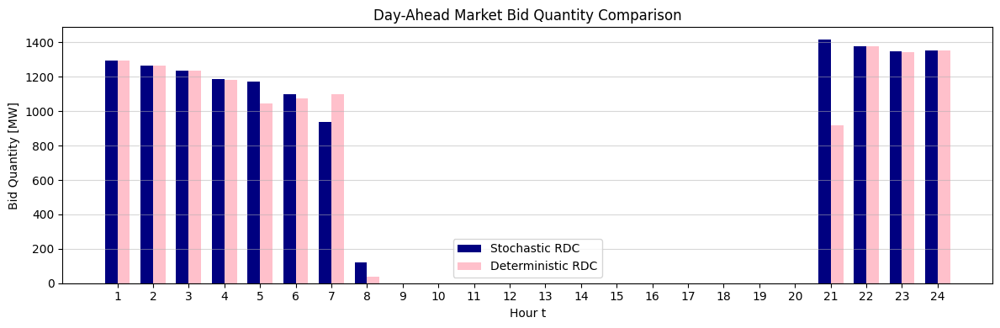

In [87]:
# ---------- p_bid 값 추출 ----------
# ---------- p_bid 값 추출 ----------
# SP (Stochastic RP 해 → Var.X 필요)
p_bid_SP = [p_bid[t].X for t in T]

# EV (Deterministic EV 해 → 이미 float 값이므로 .X 필요 없음)
p_bid_EV = [ev_sol["p_bid"][t] for t in T]
# ---------- 시각화 ----------
x = np.arange(len(T))  # 시간 축 (0~23)
width = 0.35           # 막대 폭

plt.figure(figsize=(12,4))
plt.bar(x - width/2, p_bid_SP, width, label="Stochastic RDC", color="navy")
plt.bar(x + width/2, p_bid_EV, width, label="Deterministic RDC", color="pink")

plt.xlabel("Hour t")
plt.ylabel("Bid Quantity [MW]")
plt.title("Day-Ahead Market Bid Quantity Comparison")
plt.xticks(x, T)   # x축 라벨을 Hour index로 표시
plt.legend()
plt.grid(True, axis="y", alpha=0.5)
plt.tight_layout()
plt.show()


Z_RP=563037.16, Z_EV=531904.07, Z_EEV=531904.07, VSS=31133.09


In [88]:
print("DA_rev_RP =", DA_rev.getValue())
print("RT_rev_RP =", RT_rev.getValue())

DA_rev_RP = 584295.5539580055
RT_rev_RP = -9664.172105314961


In [67]:
print("DA_rev_EEV =", DA_eval.getValue())
print("RT_rev_EEV =", RT_eval.getValue())

NameError: name 'DA_eval' is not defined

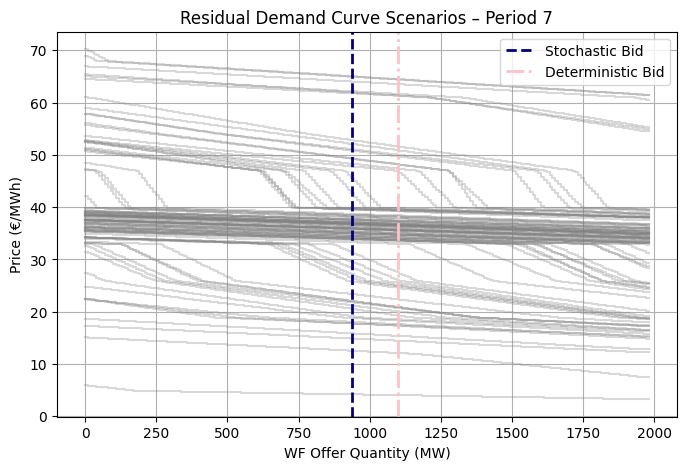

In [90]:
period = 7  # 보고 싶은 시간대

plt.figure(figsize=(8,5))

# --- 모든 RDC 시나리오 stepwise curve 그리기 ---
for w in W:
    q_steps, p_steps = [], []
    for b in valid_blocks_by_w.get((period,w), []):
        q_low  = qini_big[(period,b,w)]
        q_high = q_low + qmax_big[(period,b,w)]
        lam    = lambda_da_big[(period,b,w)]
        q_steps.extend([q_low, q_high])
        p_steps.extend([lam, lam])
    if p_steps:
        plt.step(q_steps, p_steps, where="post", alpha=0.3, color="gray")

# --- RP 해에서 선택한 p_bid 표시 ---
plt.axvline(p_bid_SP[period-1], color="navy", linestyle="--", lw=2, label="Stochastic Bid")

# --- EV 해에서 선택한 p_bid 표시 ---
plt.axvline(p_bid_EV[period-1], color="pink", linestyle="-.", lw=2, label="Deterministic Bid")

# --- Plot 꾸미기 ---
plt.xlabel("WF Offer Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title(f"Residual Demand Curve Scenarios – Period {period}")
plt.legend()
plt.grid(True)
plt.show()


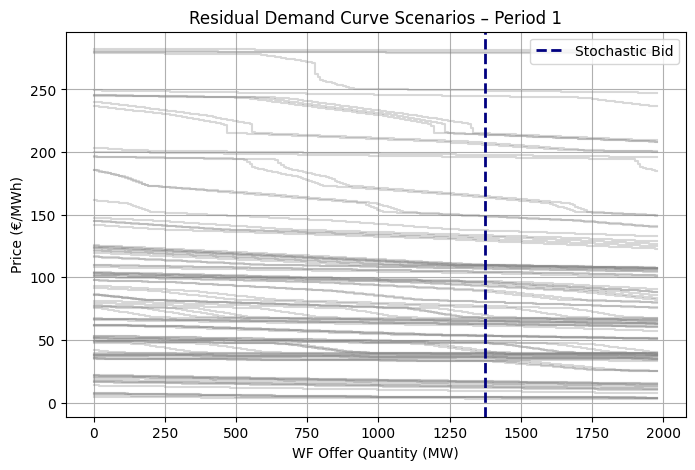

In [73]:
period = 1  # 보고 싶은 시간대

plt.figure(figsize=(8,5))

# --- 모든 RDC 시나리오 stepwise curve 그리기 ---
for w in W:
    q_steps, p_steps = [], []
    for b in valid_blocks_by_w.get((period,w), []):
        q_low  = qini_big[(period,b,w)]
        q_high = q_low + qmax_big[(period,b,w)]
        lam    = lambda_da_big[(period,b,w)]
        q_steps.extend([q_low, q_high])
        p_steps.extend([lam, lam])
    if p_steps:
        plt.step(q_steps, p_steps, where="post", alpha=0.3, color="gray")

# --- RP 해에서 선택한 p_bid 표시 ---
plt.axvline(p_bid_SP[period-1], color="navy", linestyle="--", lw=2, label="Stochastic Bid")

# --- Plot 꾸미기 ---
plt.xlabel("WF Offer Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title(f"Residual Demand Curve Scenarios – Period {period}")
plt.legend()
plt.grid(True)
plt.show()


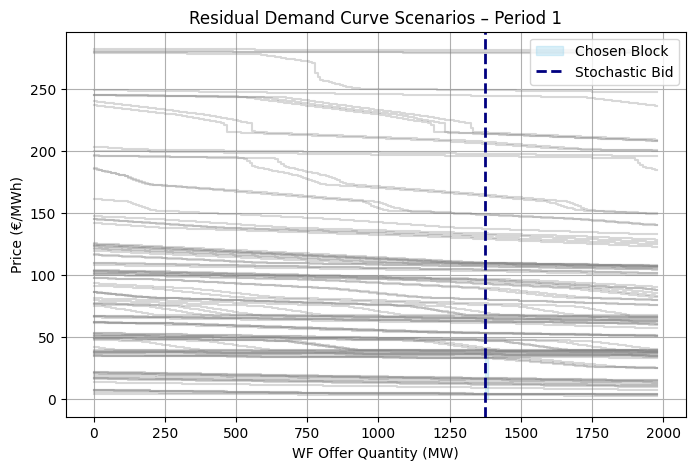

In [75]:
period = 1  # 확인할 시간대
w0 = 0      # 대표 시나리오 하나 (예: w=0 기준 블록 경계 확인용)

plt.figure(figsize=(8,5))

# --- 모든 RDC 시나리오 stepwise curve 그리기 ---
for w in W:
    q_steps, p_steps = [], []
    for b in valid_blocks_by_w.get((period,w), []):
        q_low  = qini_big[(period,b,w)]
        q_high = q_low + qmax_big[(period,b,w)]
        lam    = lambda_da_big[(period,b,w)]
        q_steps.extend([q_low, q_high])
        p_steps.extend([lam, lam])
    if p_steps:
        plt.step(q_steps, p_steps, where="post", alpha=0.3, color="gray")

# --- stochastic bid 값 ---
bid_q = p_bid_SP[period-1]

# --- 이 bid가 속한 블록 찾기 (대표 시나리오 w0 기준) ---
chosen_block = None
for b in valid_blocks_by_w.get((period,w0), []):
    q_low  = qini_big[(period,b,w0)]
    q_high = q_low + qmax_big[(period,b,w0)]
    if q_low <= bid_q <= q_high:
        chosen_block = (q_low, q_high, lambda_da_big[(period,b,w0)])
        break

# --- 해당 블록 영역 강조 ---
if chosen_block:
    q_low, q_high, lam = chosen_block
    plt.fill_between([q_low, q_high], 0, lam, color="skyblue", alpha=0.3, label="Chosen Block")

# --- stochastic bid 라인 ---
plt.axvline(bid_q, color="navy", linestyle="--", lw=2, label="Stochastic Bid")

# --- Plot 꾸미기 ---
plt.xlabel("WF Offer Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title(f"Residual Demand Curve Scenarios – Period {period}")
plt.legend()
plt.grid(True)
plt.show()


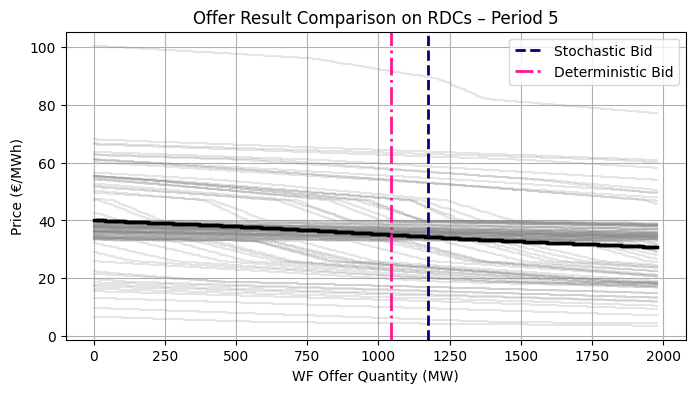

In [95]:
period = 5

plt.figure(figsize=(8,4))

# --- 1) 모든 RDC 시나리오 ---
for w in W:
    q_steps, p_steps = [], []
    for b in valid_blocks_by_w.get((period,w), []):
        q_low  = qini_big[(period,b,w)]
        q_high = q_low + qmax_big[(period,b,w)]
        lam    = lambda_da_big[(period,b,w)]
        q_steps.extend([q_low, q_high])
        p_steps.extend([lam, lam])
    if p_steps:
        plt.step(q_steps, p_steps, where="post", alpha=0.2, color="gray")

# --- 2) 평균 RDC (블록 단위 평균) ---
for b in set(b for w in W for b in valid_blocks_by_w.get((period,w), [])):
    q_low  = np.mean([qini_big[(period,b,w)] for w in W if (period,b,w) in qini_big])
    q_high = np.mean([qini_big[(period,b,w)] + qmax_big[(period,b,w)] for w in W if (period,b,w) in qmax_big])
    lam    = np.mean([lambda_da_big[(period,b,w)] for w in W if (period,b,w) in lambda_da_big])
    plt.step([q_low, q_high], [lam, lam], where="post", color="black", lw=2.5)

# --- 3) Stochastic / Deterministic 해 표시 ---
plt.axvline(p_bid_SP[period-1], color="navy", linestyle="--", lw=2, label="Stochastic Bid")
plt.axvline(p_bid_EV[period-1], color="deeppink", linestyle="-.", lw=2, label="Deterministic Bid")

plt.xlabel("WF Offer Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title(f"Offer Result Comparison on RDCs – Period {period}")
plt.legend(loc="upper right")
plt.grid(True)
plt.show()
